In [195]:
import matplotlib.pyplot as plt
import numpy as np

In [196]:
class KMeans:
    """
    Algoritmo de clustering K-Means

    Parametros:
        k (int): Número de clusters a encontrar (por defecto 3)
        max_iter (int): Número maximo de iteraciones (por defecto 100)
        centroids (numpy.ndarray): Cordenadas iniciales del centroides (por defecto ninguna)
    """
    def __init__(self, k=3, max_iter=100, centroids = None):
        """
        Constructor de objetos kMeans

        Parametros:
            k (int): Número de cluster
            max_iter (int): Número maximo de iteraciones
        """
        self.k = k
        self.max_iter = max_iter
        self.centroids = centroids

    def distancia_euclideana(self, p1, p2):
        """
        Calcula la distancia Euclideana entre dos puntos.

        Parametros:
            point1 (numpy.ndarray): Primer punto
            point2 (numpy.ndarray): Segundo punto

        Returns:
            float: La distancia euclideana entre los dos puntos
        """
        return np.sqrt(np.sum((p1 - p2)**2))

    def distancia_manhattan(self, point1, point2):
        """
        Calcula la distancia de Manhattan entre dos puntos

        Parametros:
            point1 (numpy.ndarray): Primer punto.
            point2 (numpy.ndarray): Segundo punto

        Returns:
            float: Distancia de Manhattan entre dos puntos
        """
        return np.sum(np.abs(point1 - point2))

    def distancia_mahalanobis(self, point1, point2, covariance_matrix):
        """
        Cacula la distancia de Mahalanobis entre dos puntos

        Parametros:
            point1 (numpy.ndarray): Primer punto.
            point2 (numpy.ndarray): Segundo punto.
            covariance_matrix (numpy.ndarray): Matrix de covarancia de los datos.

        Returns:
            float: La distancia de Mahalanobis entre dos puntos
        """
        diff = point1 - point2
        return np.sqrt(diff @ np.linalg.inv(covariance_matrix) @ diff.T)

    def calcular_centroides(self, points, labels):
        """
        Calcula los centroides de la nube de puntos dada por la asignación en la variable labels

        Parametros:
            points (numpy.ndarray): Nube de puntos
            labels (numpy.ndarray): Cluster asignado para cada punto

        Returns:
            numpy.ndarray: Centroides de cada cluster
        """

        centroids = np.zeros((self.k, points.shape[1]))
        for i in range(self.k):
            cluster_points = points[labels == i]
            if len(cluster_points) > 0:
              centroids[i] = np.mean(cluster_points, axis=0)
        return centroids

    def run(self, points, tipo_distance='euclidean'):
        """
        Ejecuta un algoritmo K-Means dado la nube de puntos recibida como parametro

        Parametros:
            points (numpy.ndarray): Nube de puntos
            tipo_distance (str): Tipo de distancia a utilizar ('euclidean', 'manhattan', or 'mahalanobis'). Por defecto  'euclidean'.

        Returns:
            numpy.ndarray: El cluster asignado a cada grupo
        """

        indices = np.random.choice(points.shape[0], self.k, replace=False)
        self.centroids = points[indices]

        for _ in range(self.max_iter):
            labels = np.zeros(points.shape[0], dtype=int)
            for i, point in enumerate(points):
                if tipo_distance == 'euclidean':
                    distances = [self.distancia_euclideana(point, centroid) for centroid in self.centroids]
                elif tipo_distance == 'manhattan':
                    distances = [self.distancia_manhattan(point, centroid) for centroid in self.centroids]
                elif tipo_distance == 'mahalanobis':
                    covariance_matrix = np.cov(points, rowvar=False)
                    distances = [self.distancia_mahalanobis(point, centroid, covariance_matrix) for centroid in self.centroids]
                else:
                    raise ValueError("Tipo de distancia no disponible")
                labels[i] = np.argmin(distances)

            new_centroids = self.calcular_centroides(points, labels)

            if np.array_equal(self.centroids, new_centroids):
                break

            self.centroids = new_centroids
        return labels

In [197]:
from mpl_toolkits.mplot3d import Axes3D

def dibujar2D (points, centroids, labels):
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.scatter(points[:, 0], points[:, 1], c='blue', label='Puntos')
    plt.title('Antes de kmeans')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.scatter(points[:, 0], points[:, 1], c=labels, cmap='viridis', label='Puntos')
    plt.scatter(centroids[:, 0], centroids[:, 1], c='red', marker='*', s=200, label='Centroides finales')
    plt.title('Despues de kmeans')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.legend()

    plt.tight_layout()
    plt.show()

def dibujar3D (points, centroids, labels):
    fig = plt.figure(figsize=(10, 5))
    ax1 = fig.add_subplot(121, projection='3d')
    ax1.scatter(points[:, 0], points[:, 1], points[:, 2], c='blue', label='Puntos')
    ax1.set_title('Antes de kmeans')
    ax1.set_xlabel('X')
    ax1.set_ylabel('Y')
    ax1.set_zlabel('Z')
    ax1.legend()


    # Plot the points and final centroids
    ax2 = fig.add_subplot(122, projection='3d')
    ax2.scatter(points[:, 0], points[:, 1], points[:, 2], c=labels, cmap='viridis', alpha=0.1, label='Puntos')
    ax2.scatter(centroids[:, 0], centroids[:, 1], centroids[:, 2], c='red', marker='*', s=200, label='Centroides finales', edgecolors='black', depthshade=False)
    ax2.set_title('Despues de kmeans')
    ax2.set_xlabel('X')
    ax2.set_ylabel('Y')
    ax2.set_zlabel('Z')
    ax2.legend()

    plt.tight_layout()
    plt.show()

In [198]:
# Ejemplo de uso (datos con 2 caracteristicas) usando distancia euclideana
points = np.array([[1, 2], [1.5, 1.8], [5, 8], [8, 8], [1, 0.6], [9, 11]])
kmeans = KMeans(k=2)
labels = kmeans.run(points)
print(labels)
print(kmeans.centroids)

[0 0 1 1 0 1]
[[1.16666667 1.46666667]
 [7.33333333 9.        ]]


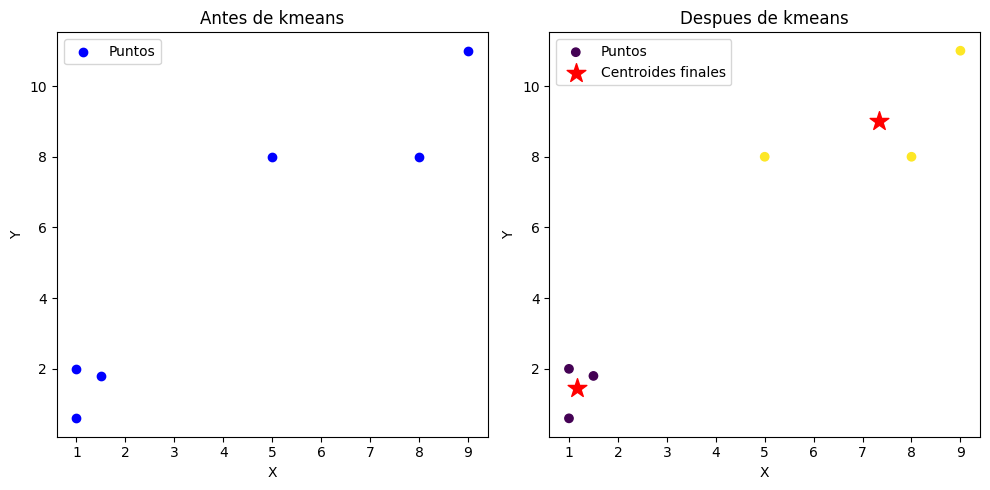

In [199]:
dibujar2D(points, kmeans.centroids, labels)

In [200]:
# Ejemplo de uso (datos con 2 caracteristicas) usando distancia de Manhattan
points = np.array([[1, 2], [1.5, 1.8], [5, 8], [8, 8], [1, 0.6], [9, 11]])
kmeans = KMeans(k=2)
labels = kmeans.run(points, tipo_distance="mahalanobis")
print(labels)
print(kmeans.centroids)

[0 1 0 1 1 0]
[[5.         7.        ]
 [3.5        3.46666667]]


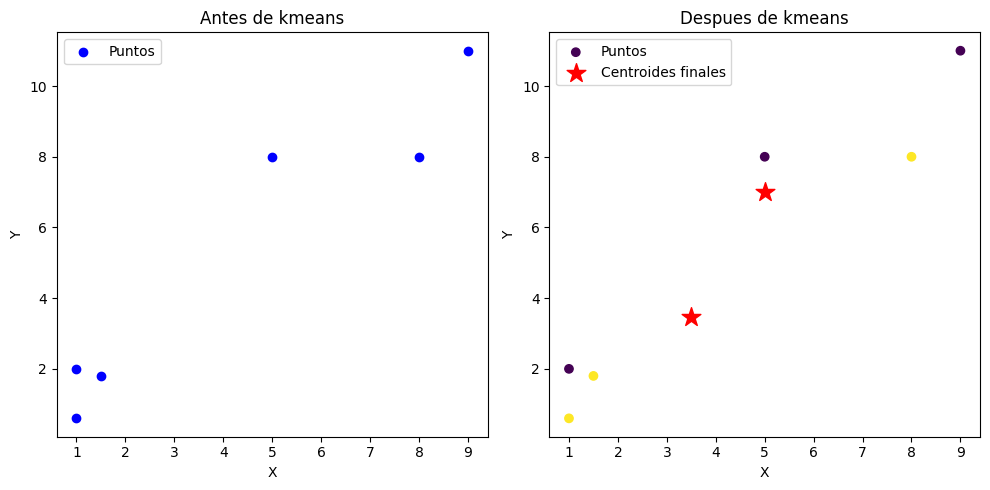

In [201]:
dibujar2D(points, kmeans.centroids, labels)

In [202]:
# Ejemplo de uso (datos con 3 caracteristicas)
points = np.array([[1, 2, 0], [1.5, 1.8, 6], [-1, 5, 8], [3.2, 8, 8], [3, 1, 0.6], [-8, 9, 11]])
kmeans = KMeans(k=3)
labels = kmeans.run(points)
print(labels)
print(kmeans.centroids)

[2 2 0 0 2 1]
[[ 1.1         6.5         8.        ]
 [-8.          9.         11.        ]
 [ 1.83333333  1.6         2.2       ]]


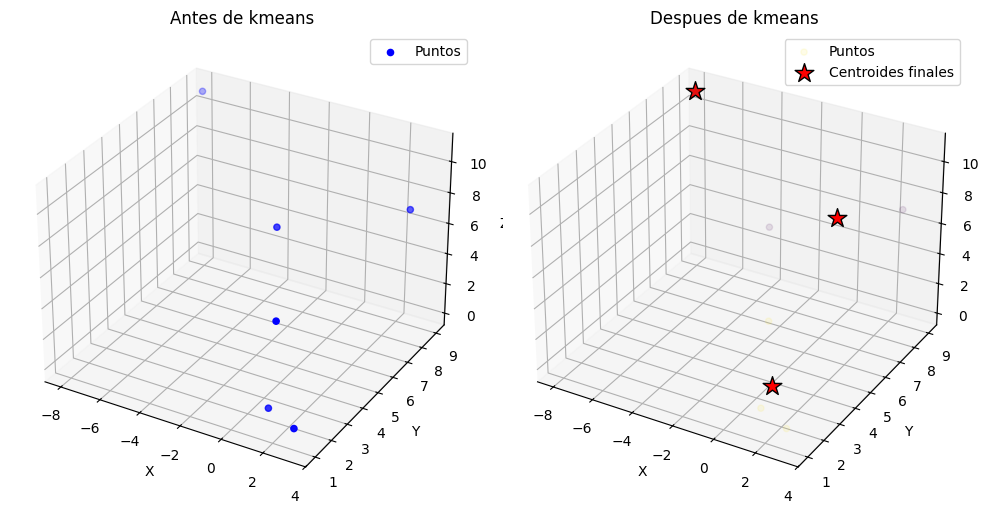

In [203]:
dibujar3D(points, kmeans.centroids, labels)

In [204]:
from sklearn.datasets import make_blobs
points, y = make_blobs(n_samples = 1000,n_features = 2,centers = 3,random_state = 23)

In [205]:
kmeans = KMeans(k=3)
labels = kmeans.run(points)
print(labels)
print(kmeans.centroids)

[0 1 0 0 1 0 0 2 0 0 0 0 0 0 2 0 0 0 2 1 0 2 0 0 0 0 1 0 0 0 0 0 2 0 2 0 1
 0 0 1 0 2 2 0 0 1 0 0 1 1 0 0 2 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 0 1
 1 0 0 0 2 1 0 0 1 0 0 0 2 0 2 0 0 2 0 0 0 0 0 1 0 0 0 0 2 0 0 0 0 0 1 2 0
 0 0 0 0 0 0 1 0 0 0 0 2 2 1 2 0 0 0 0 0 1 0 0 0 2 2 0 1 0 2 0 0 1 1 0 2 0
 0 0 0 0 0 0 1 1 1 2 0 2 0 1 0 0 0 1 2 0 1 1 1 0 1 1 0 0 0 0 0 1 2 0 0 1 0
 1 0 1 1 2 1 1 1 0 0 2 0 0 0 0 0 0 1 1 0 0 1 0 0 0 0 2 0 0 0 2 2 0 0 1 1 0
 0 0 0 2 0 0 2 0 1 1 2 1 2 1 1 1 1 0 0 0 2 1 1 0 2 0 1 0 0 0 0 0 0 0 1 0 1
 1 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 2 1 0 0
 0 0 2 1 1 0 0 0 1 1 0 0 0 0 0 2 0 1 0 1 0 0 1 0 2 1 0 0 0 1 0 0 0 0 2 0 0
 0 0 1 0 0 0 0 2 2 0 0 0 0 2 0 0 0 0 0 0 2 0 2 1 1 0 0 0 0 0 0 0 0 0 1 1 0
 1 1 0 0 0 0 0 1 0 2 2 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 2 1 1 0 0 0 0 0 0 0
 1 2 0 2 0 0 0 1 0 1 0 0 2 2 1 1 0 0 0 0 0 0 0 0 1 0 2 2 0 1 0 0 0 1 0 0 0
 0 0 0 0 0 1 0 0 1 2 0 2 2 1 0 0 1 0 0 1 0 1 1 0 0 0 0 0 1 2 0 0 1 0 0 0 1
 0 0 1 1 0 0 0 2 0 1 0 0 

#Grupo 5#

#Primer Experimento#
Sebastian Cotes

Yefferson Gonzalez

Lorann Peñuela


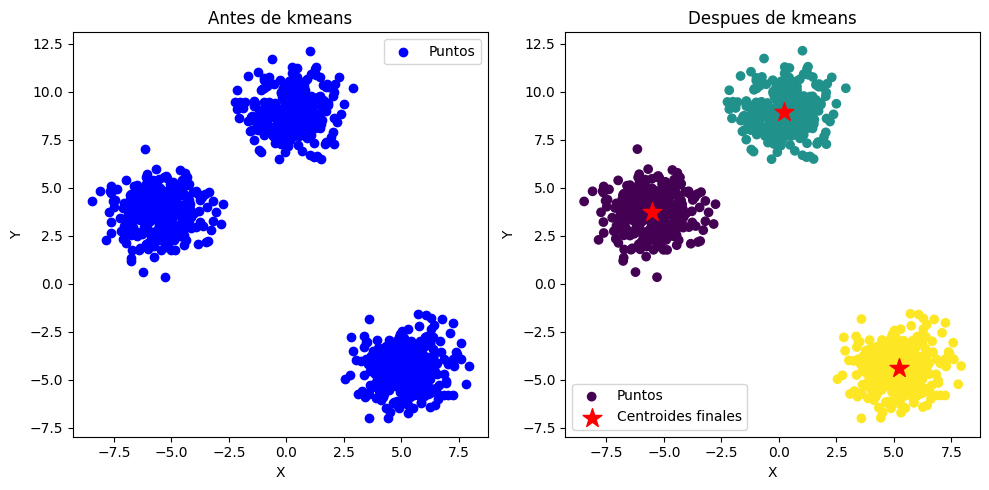

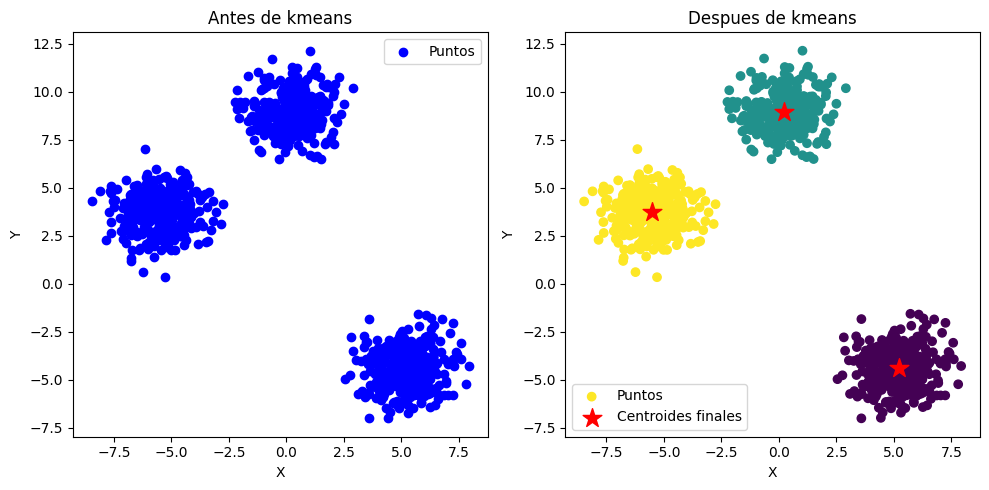

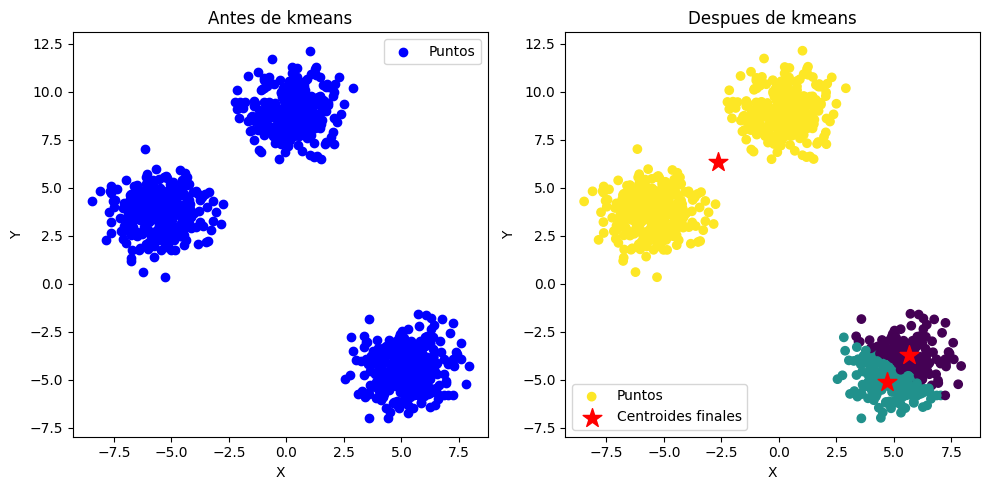

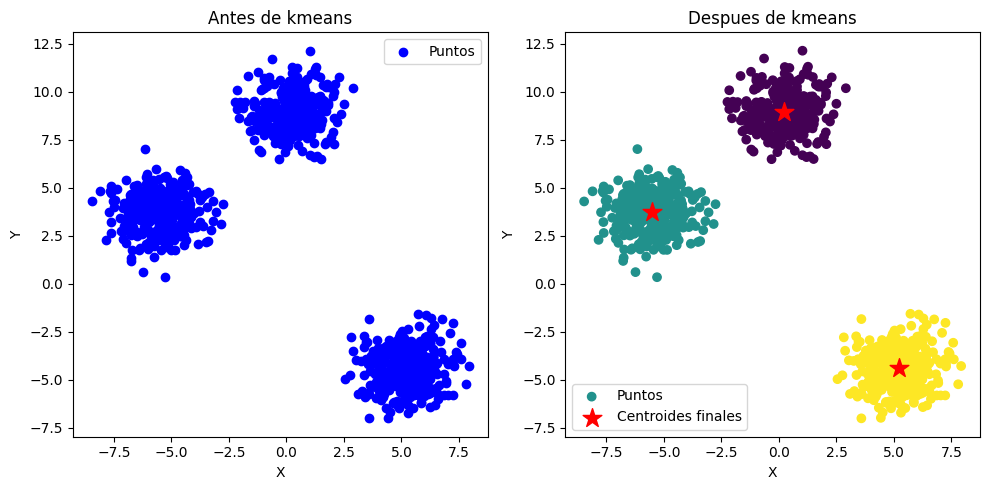

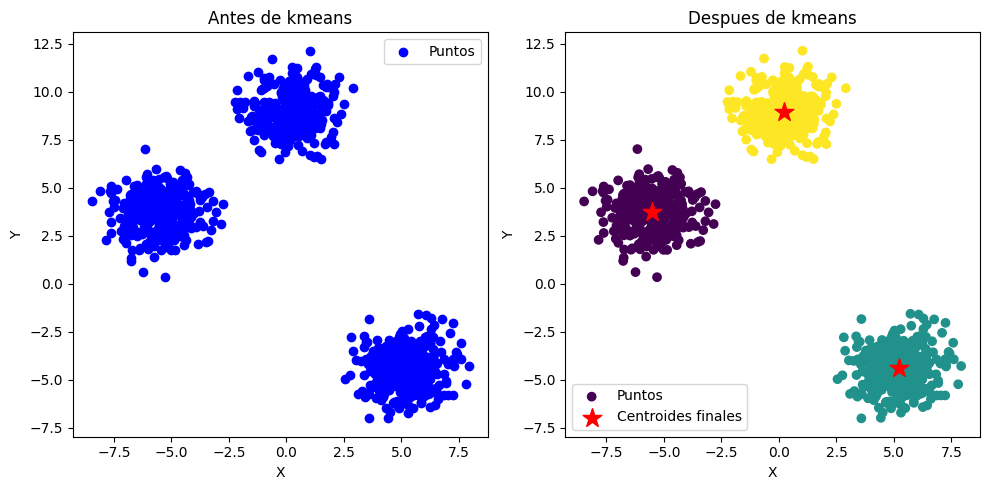

100


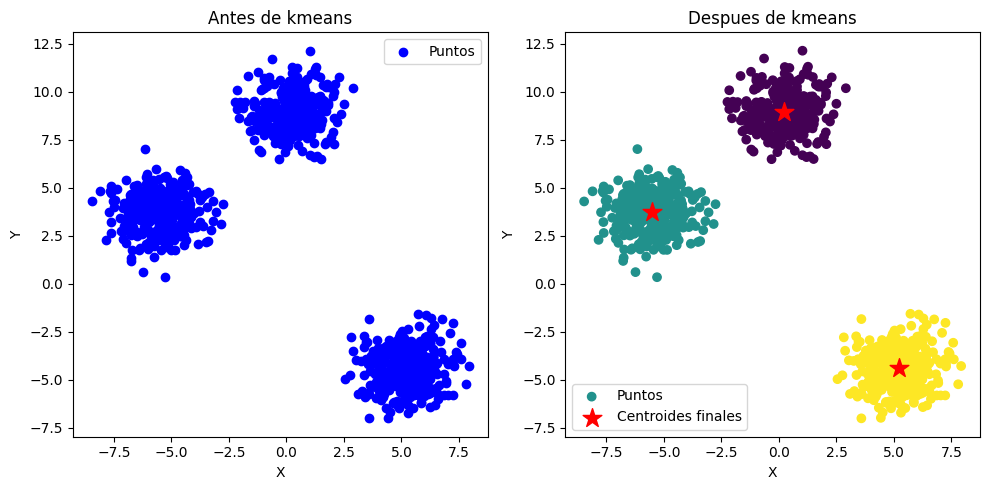

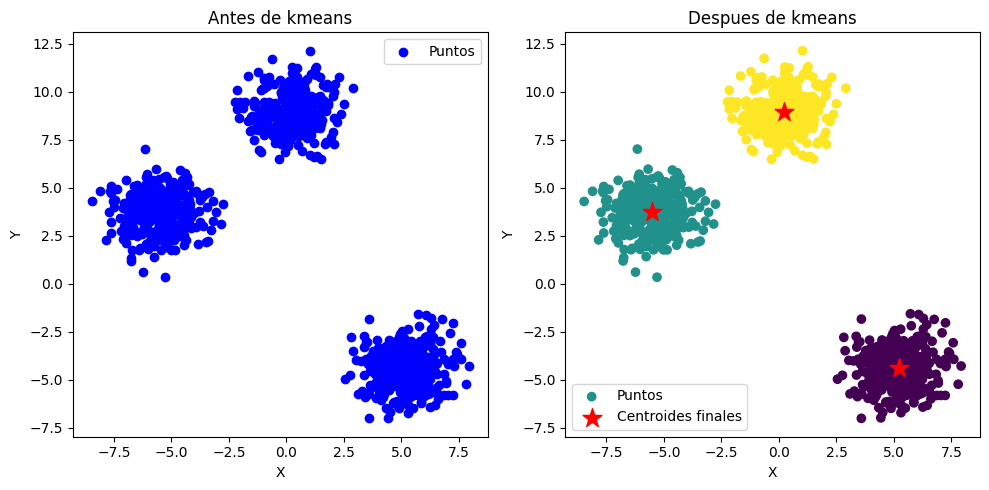

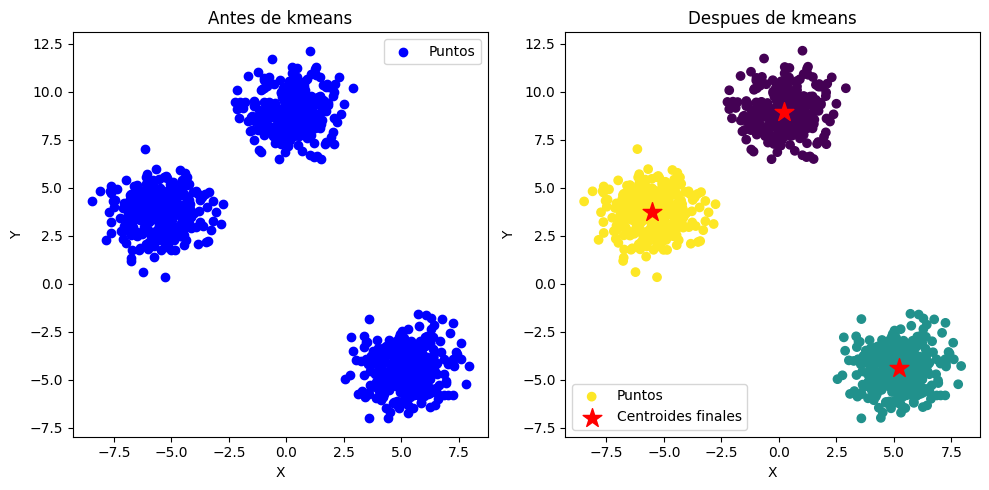

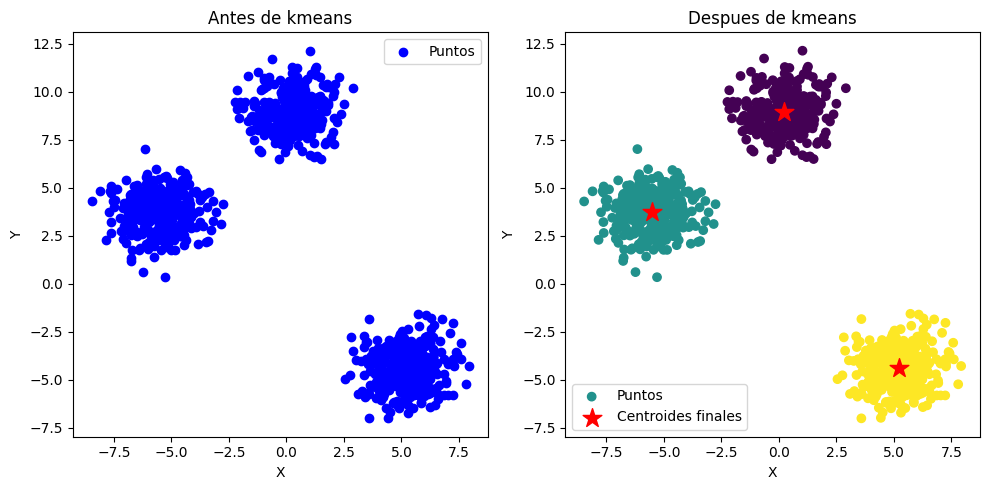

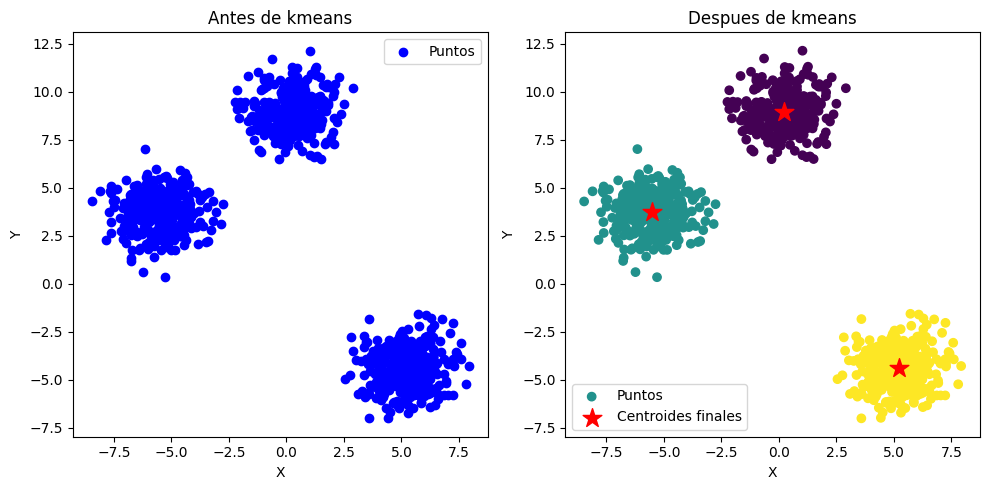

1000


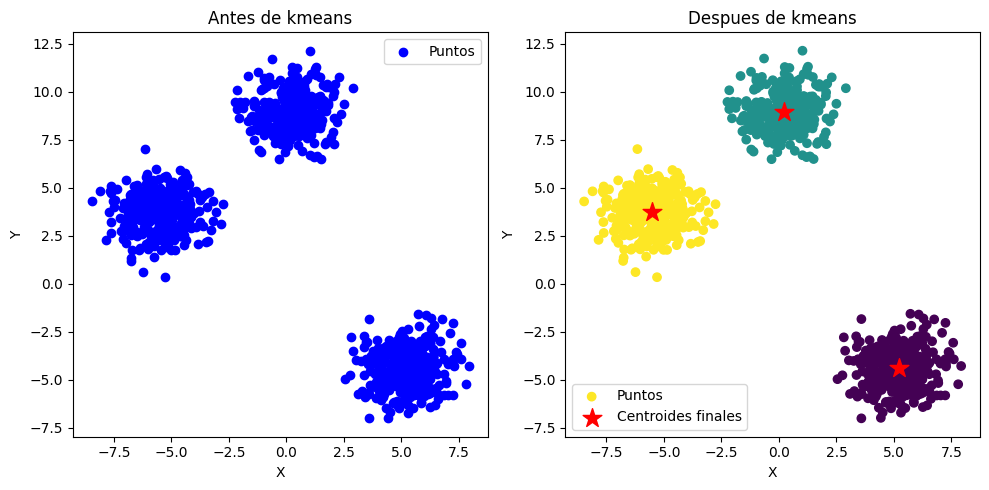

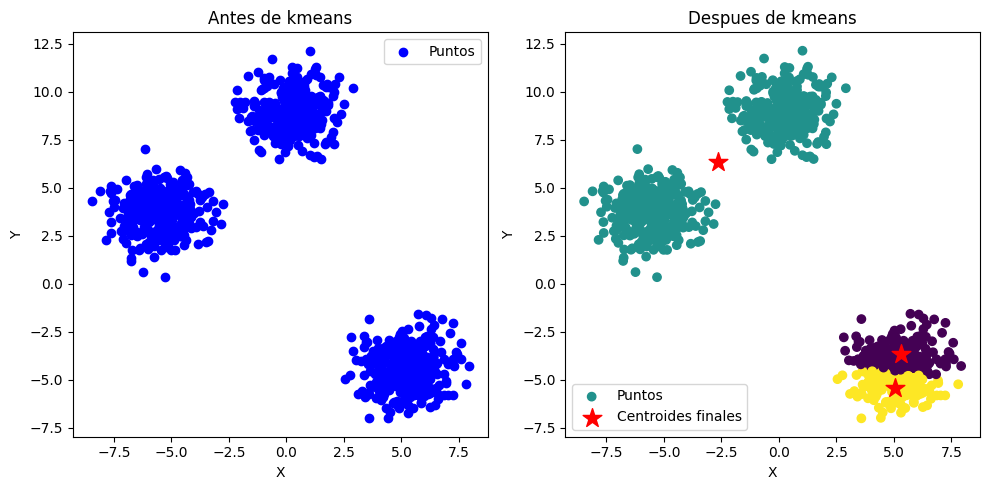

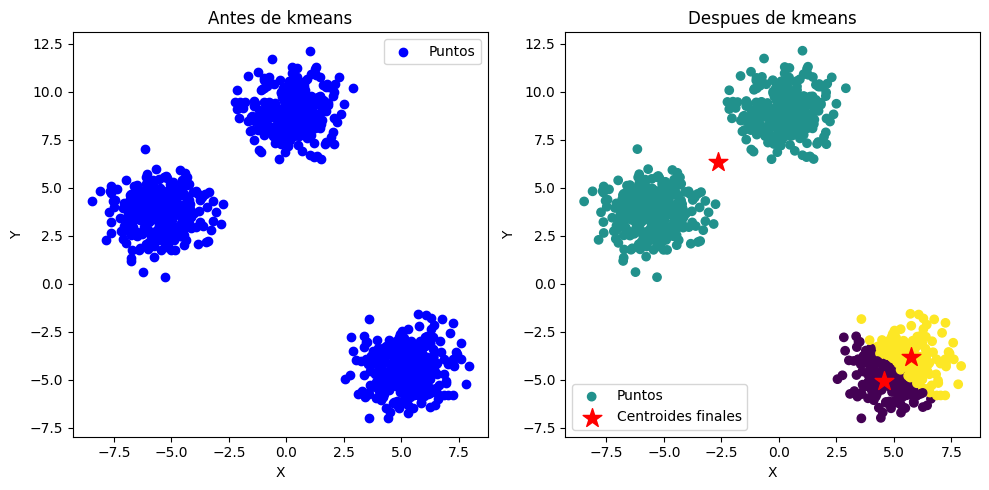

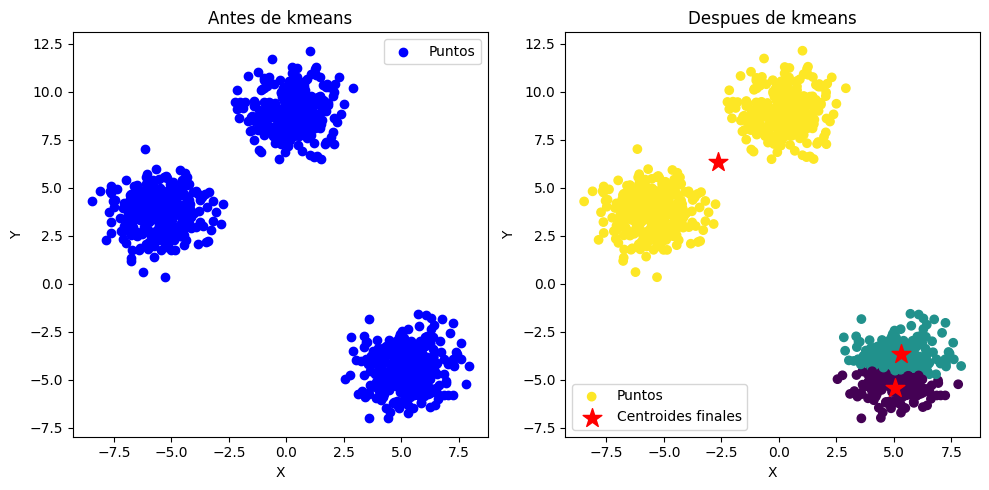

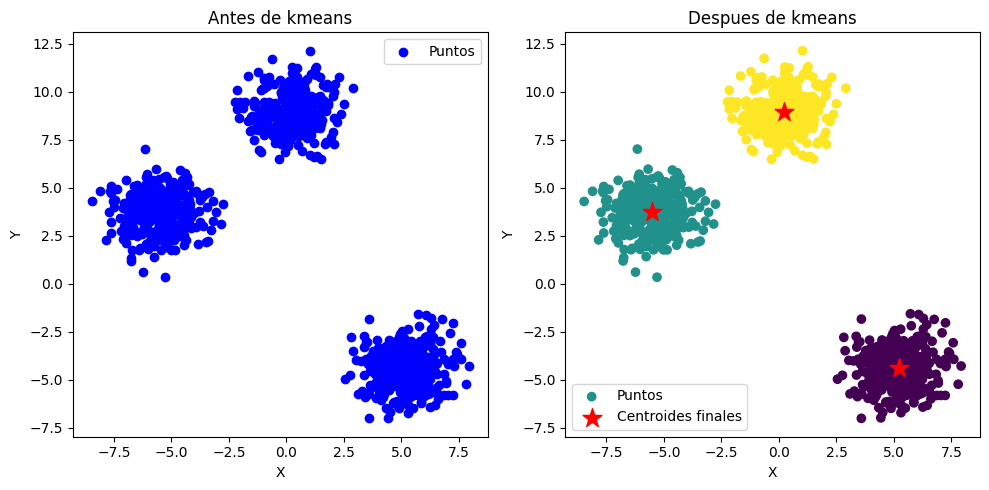

10000


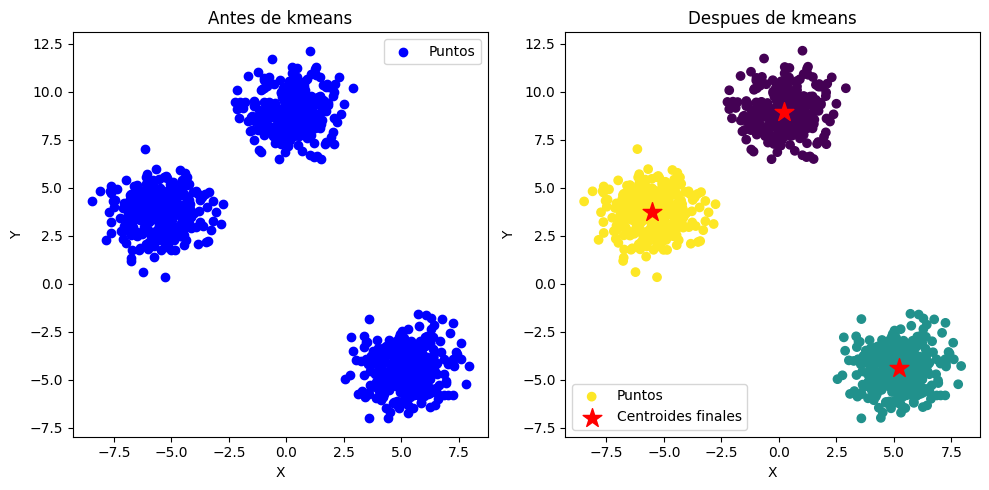

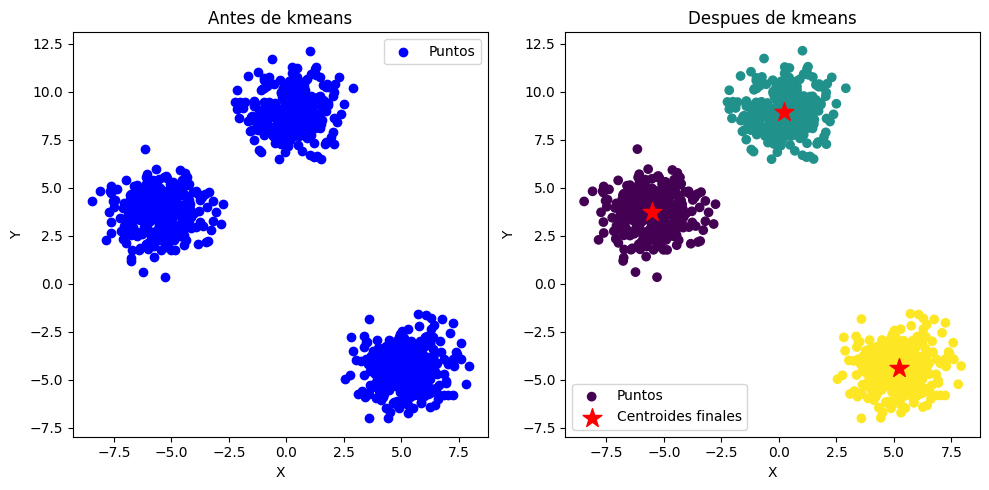

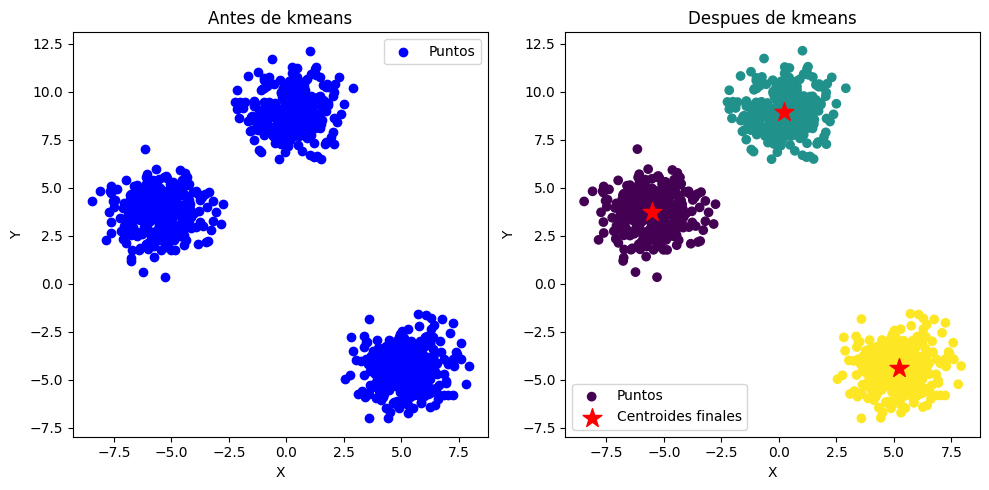

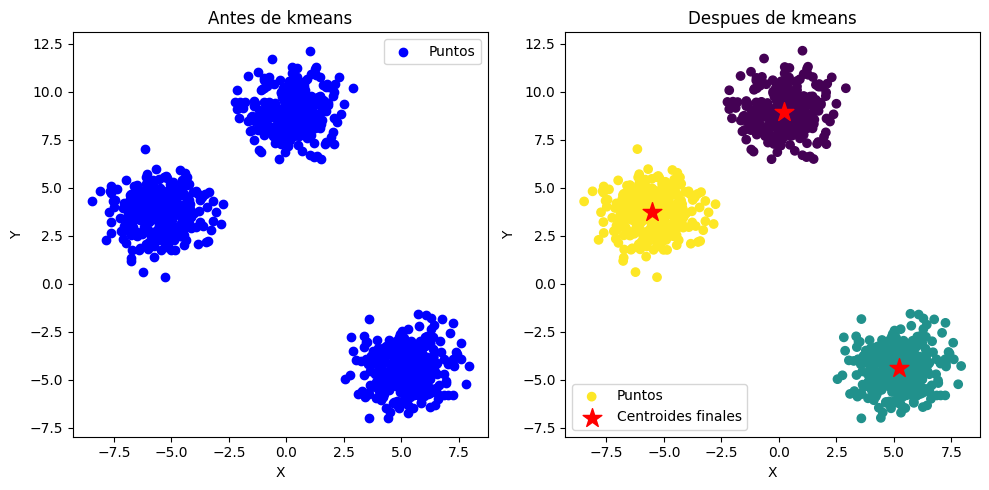

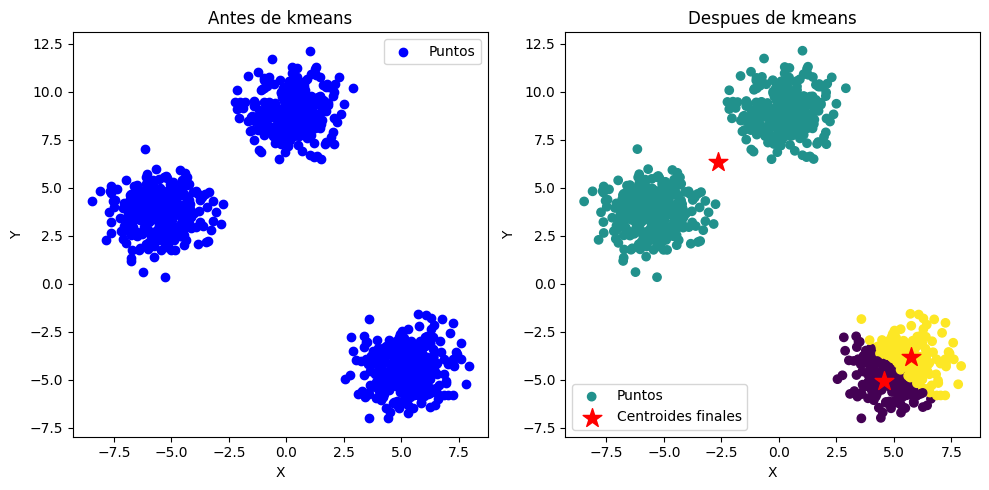

In [206]:
for i in range(5):
  kmeans = KMeans(k=3, max_iter=10)
  labels = kmeans.run(points)
  dibujar2D(points, kmeans.centroids, labels)
print("100")
for i in range(5):
  kmeans = KMeans(k=3, max_iter=100)
  labels = kmeans.run(points)
  dibujar2D(points, kmeans.centroids, labels)
print("1000")
for i in range(5):
  kmeans = KMeans(k=3, max_iter=1000)
  labels = kmeans.run(points)
  dibujar2D(points, kmeans.centroids, labels)
print("10000")
for i in range(5):
  kmeans = KMeans(k=3, max_iter=10000)
  labels = kmeans.run(points)
  dibujar2D(points, kmeans.centroids, labels)

#Analisis 1 Exp.
10 iteraciones: Convergencia en 3-5 iteraciones 60%.

100 iteraciones: Convergencia 4-5 iteraciones  10%.

1000 iteraciones: Convergencia en 4-5 iteraciones 1%.

10000 iteraciones: Convergencia en 4-5 iteraciones 0.1%.

Necesitamos almenos 100 iteraciones para obterner un resultado aceptable pero no 100% preciso.

#Segundo Experimento#

In [207]:
from sklearn.datasets import make_blobs
points, y = make_blobs(n_samples = 1000,n_features = 3,centers = 3,random_state = 23)

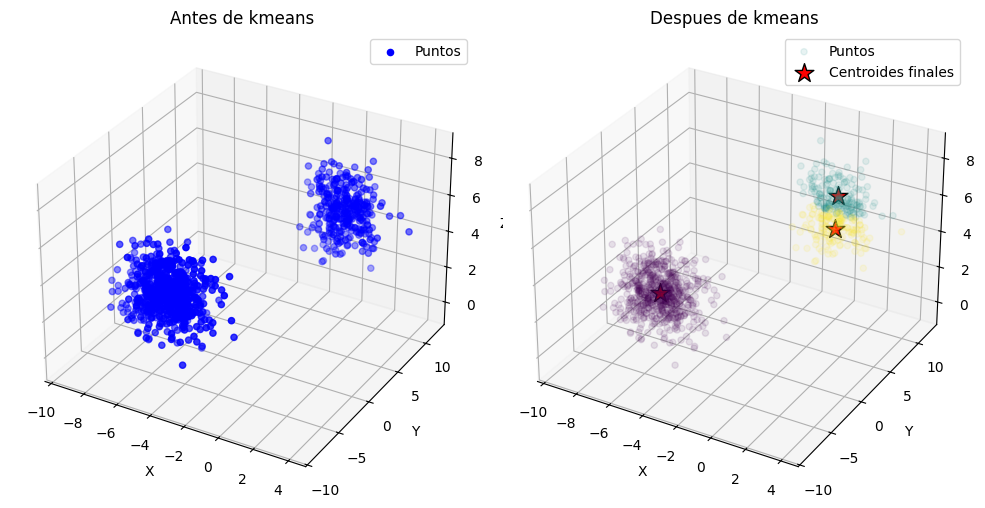

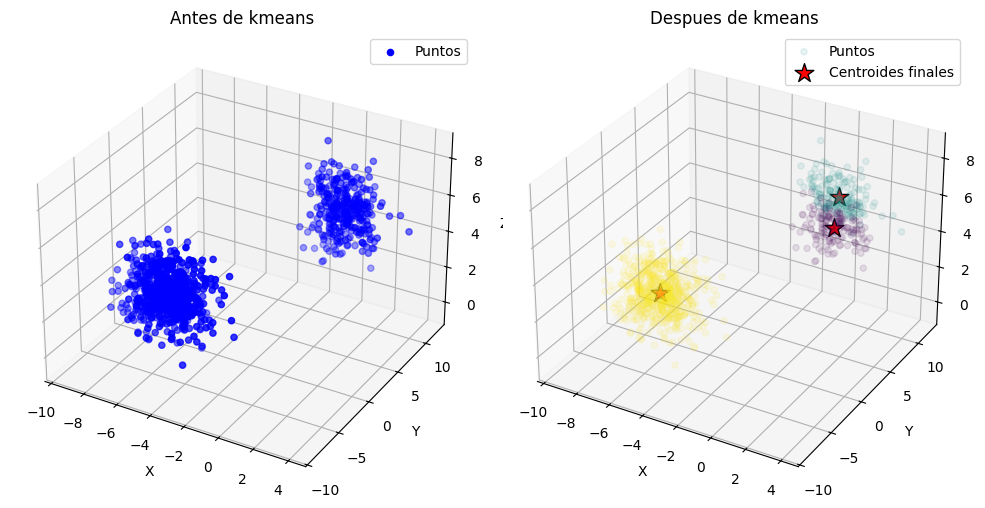

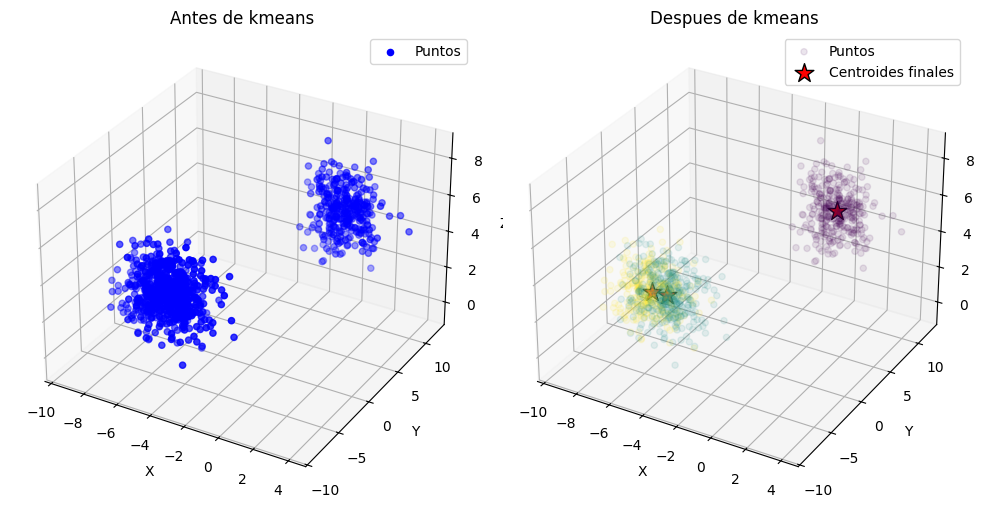

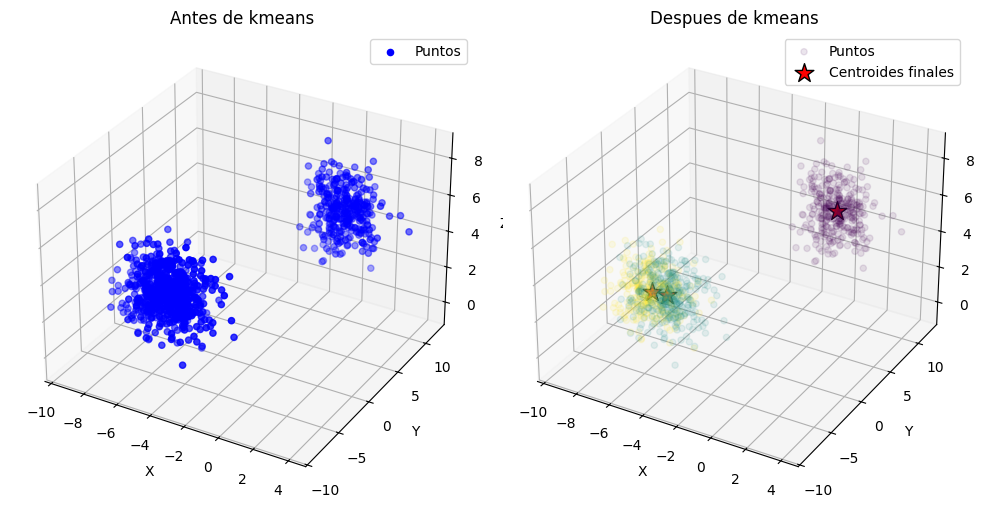

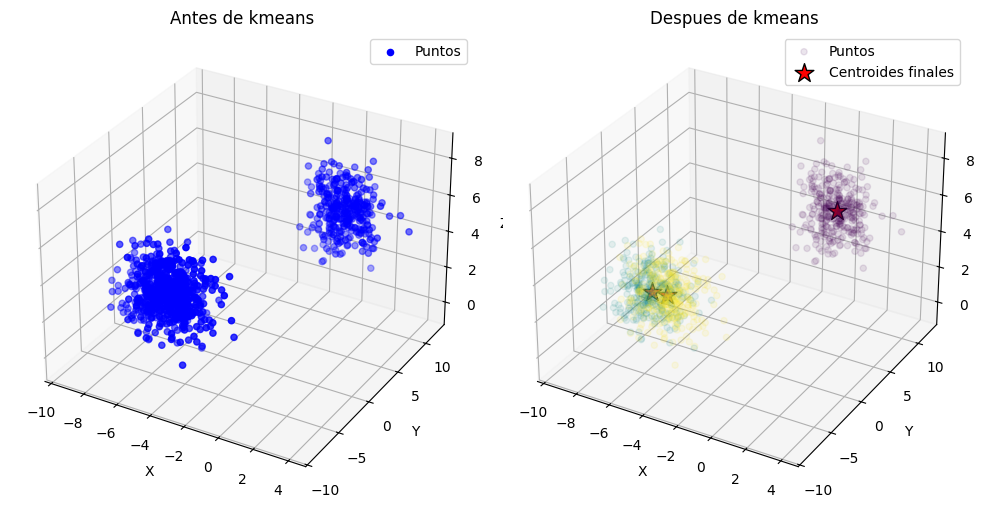

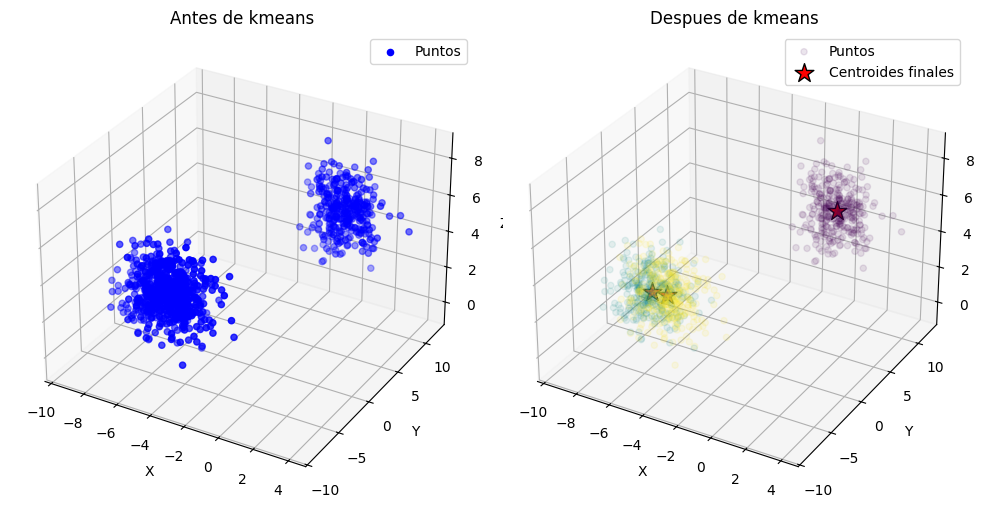

100


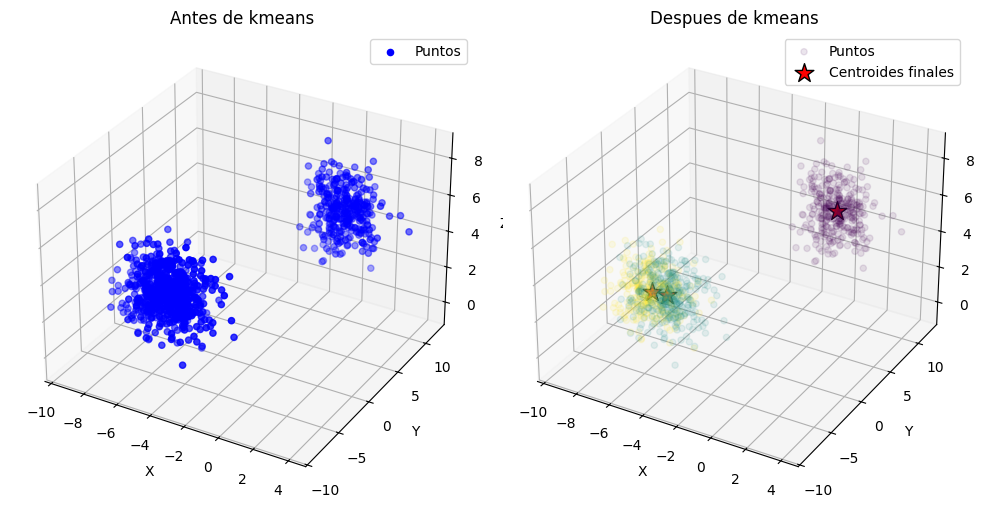

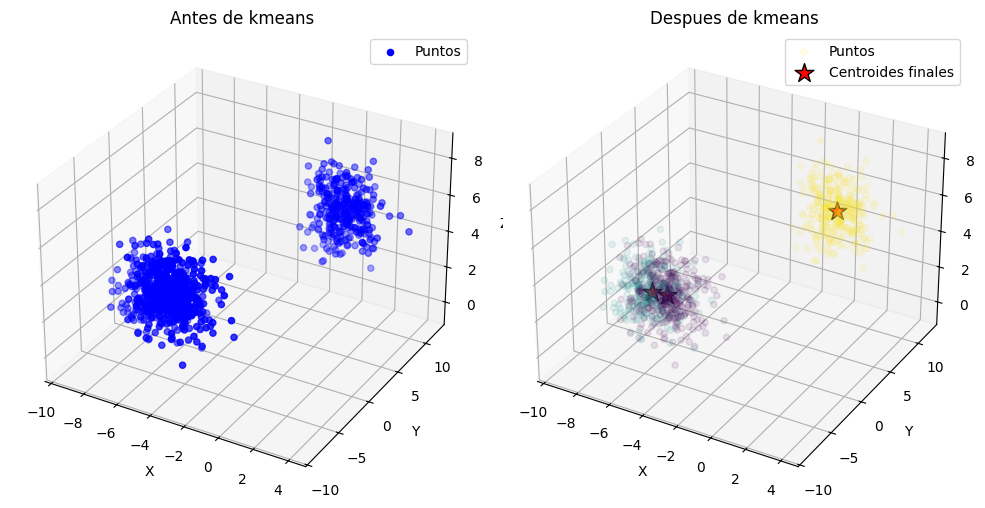

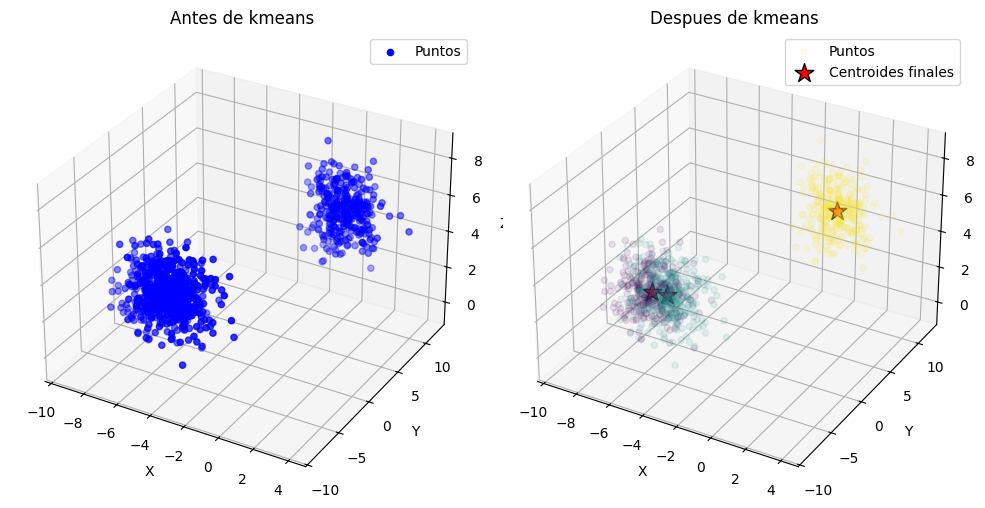

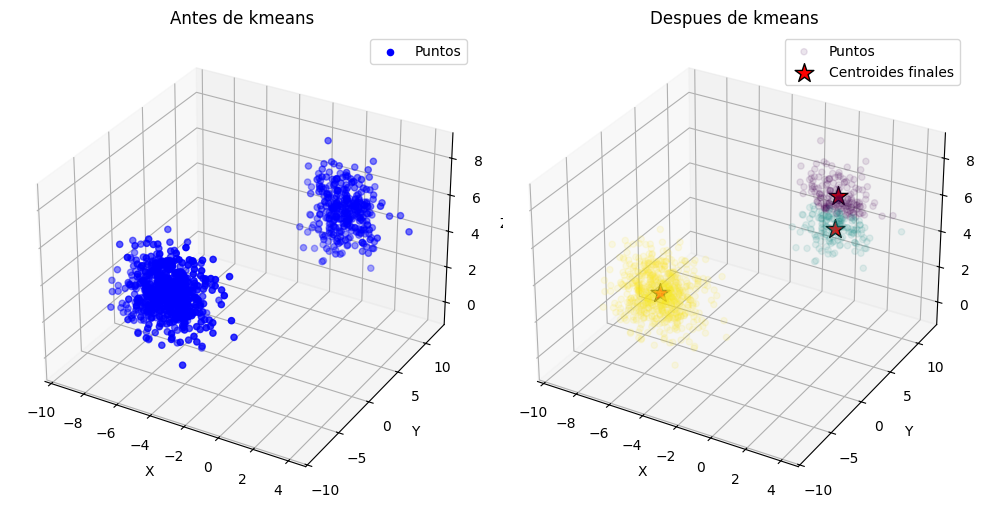

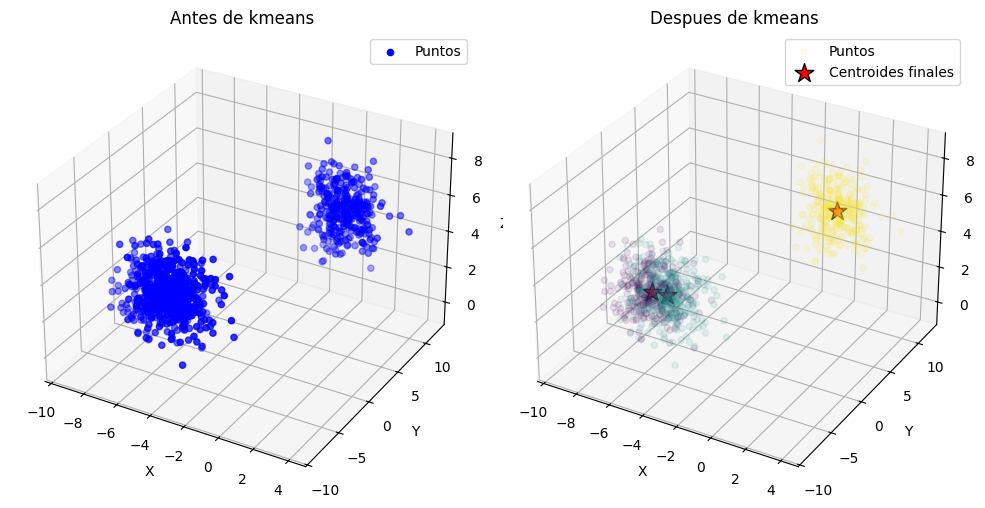

1000


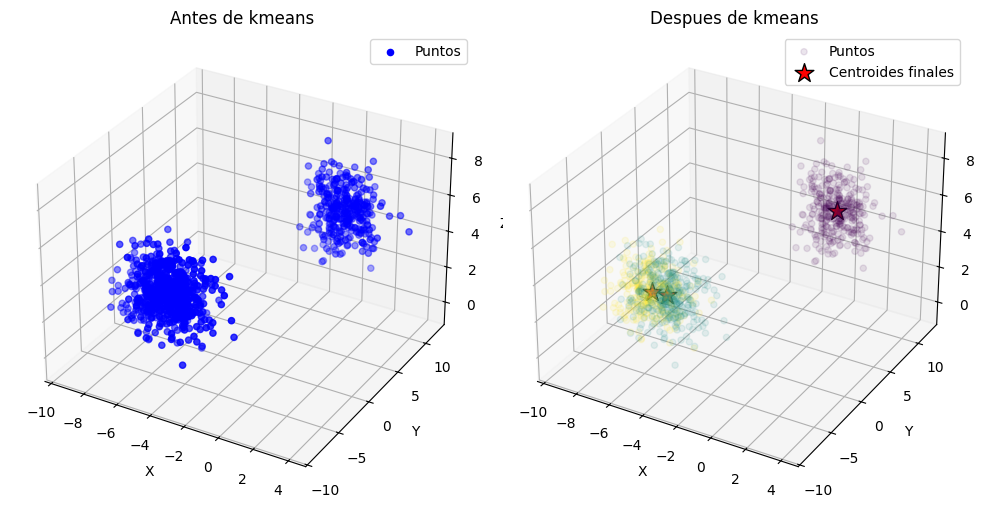

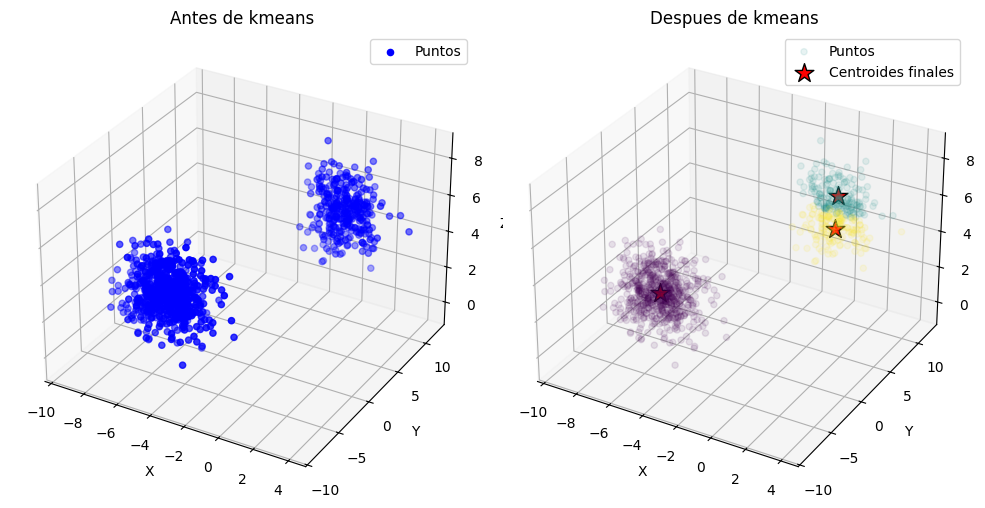

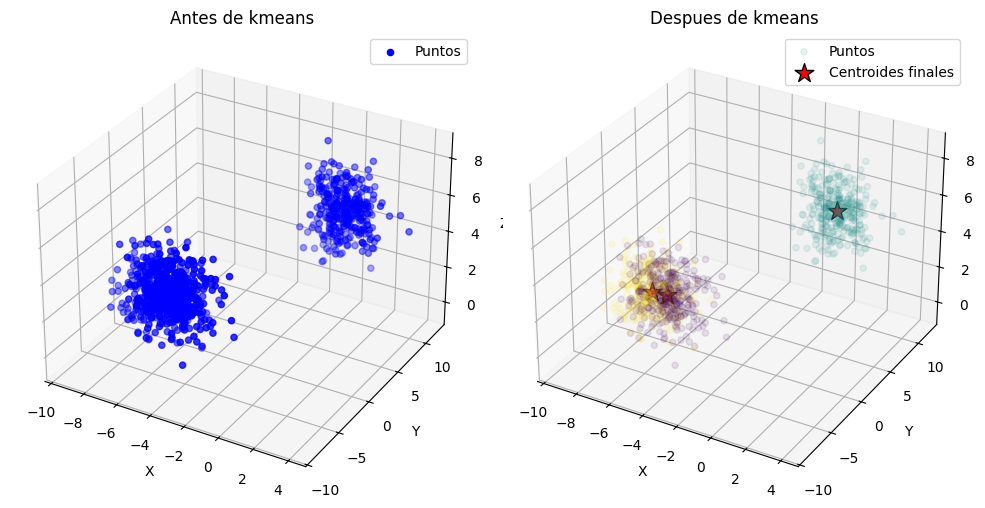

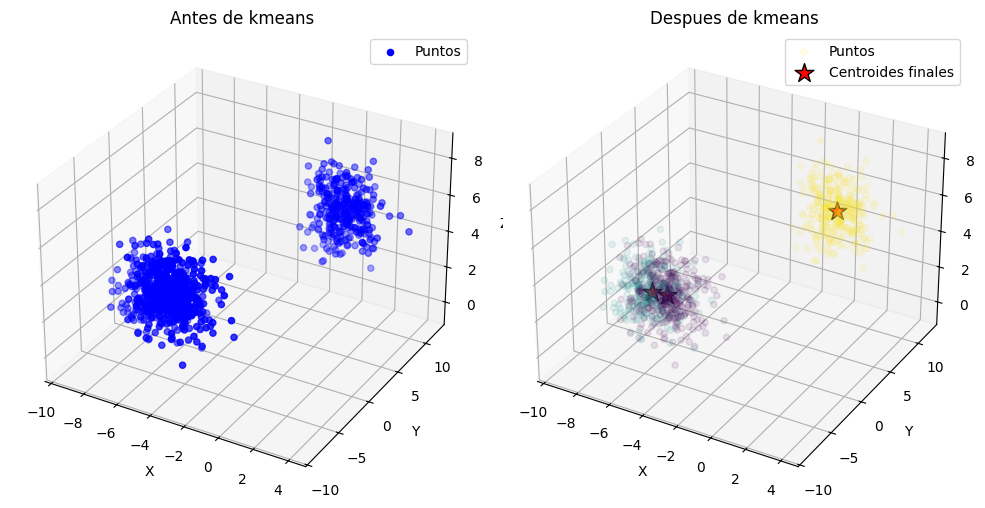

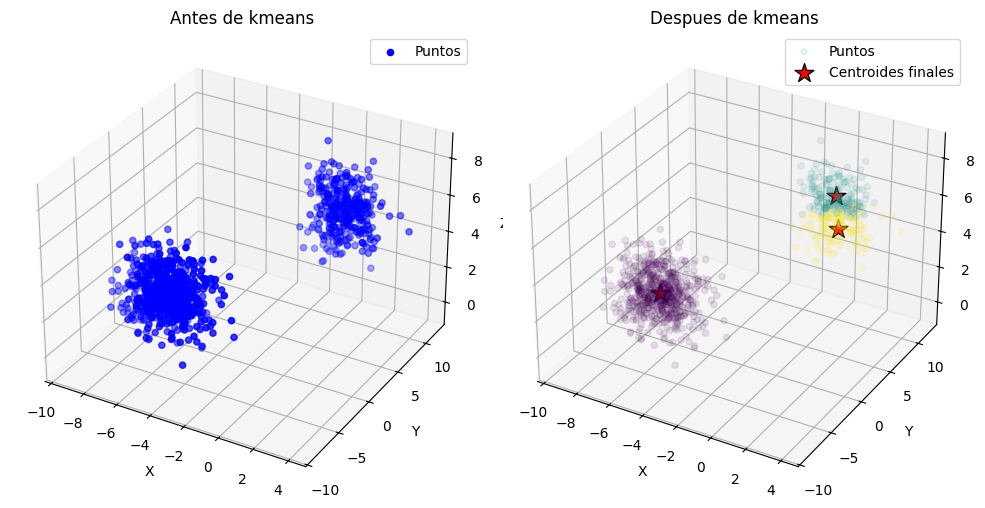

10000


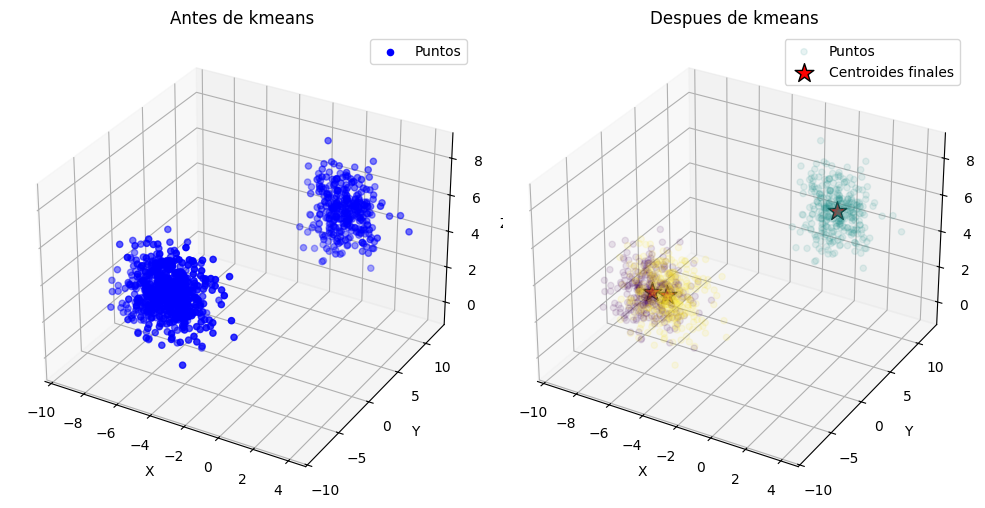

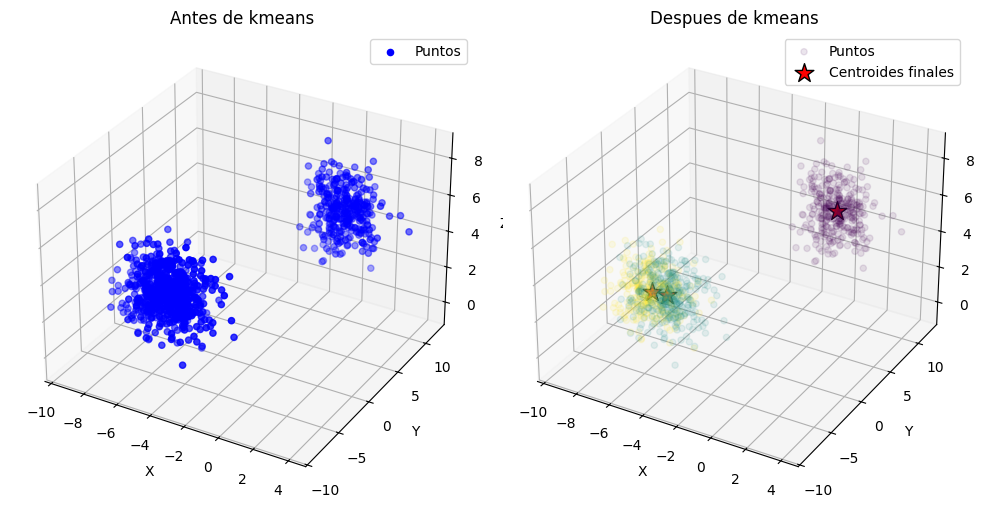

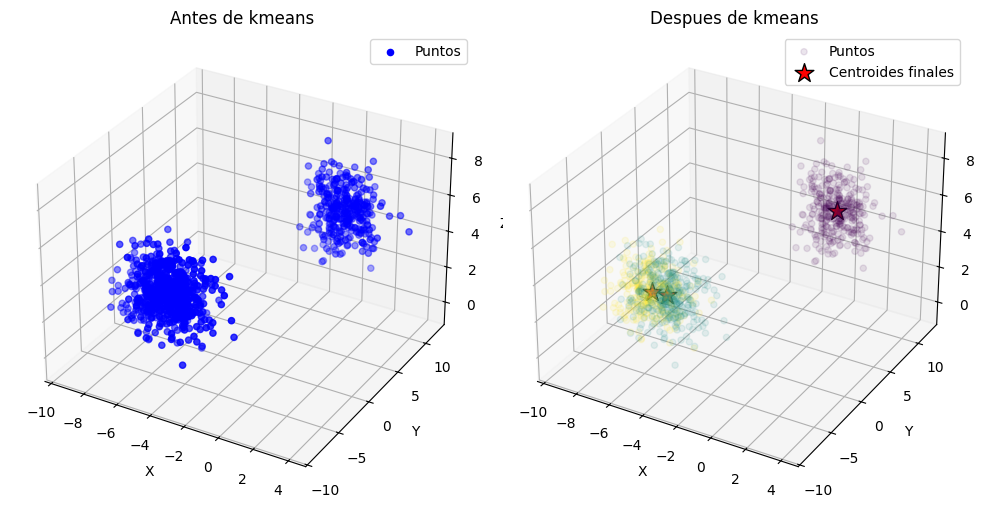

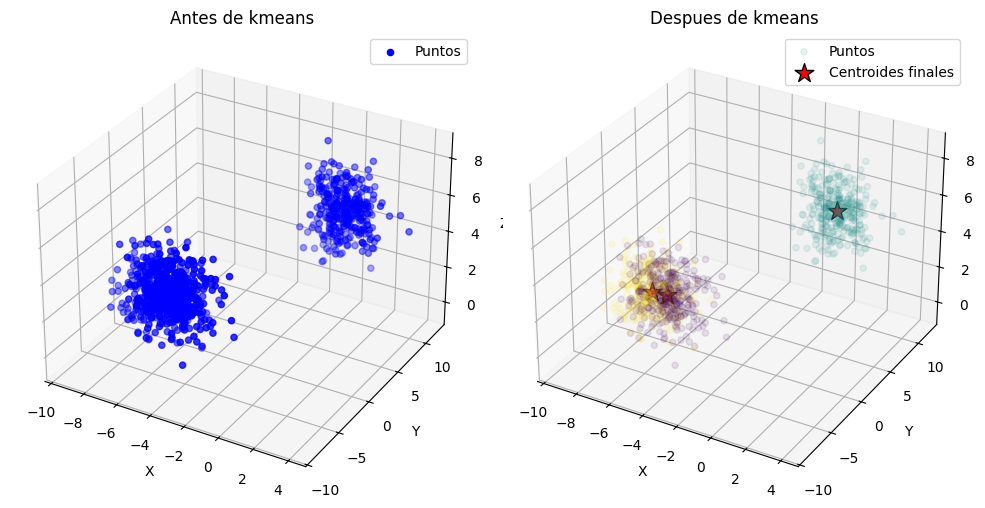

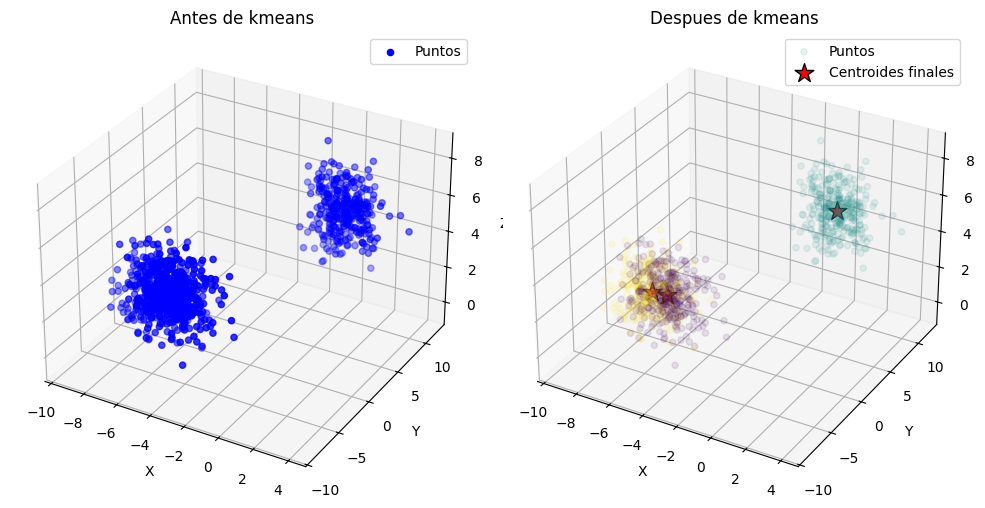

In [208]:
kmeans = KMeans(k=3)
labels = kmeans.run(points)
dibujar3D(points, kmeans.centroids, labels)
for i in range(5):
  kmeans = KMeans(k=3, max_iter=10)
  labels = kmeans.run(points)
  dibujar3D(points, kmeans.centroids, labels)
print("100")
for i in range(5):
  kmeans = KMeans(k=3, max_iter=100)
  labels = kmeans.run(points)
  dibujar3D(points, kmeans.centroids, labels)
print("1000")
for i in range(5):
  kmeans = KMeans(k=3, max_iter=1000)
  labels = kmeans.run(points)
  dibujar3D(points, kmeans.centroids, labels)
print("10000")
for i in range(5):
  kmeans = KMeans(k=3, max_iter=10000)
  labels = kmeans.run(points)
  dibujar3D(points, kmeans.centroids, labels)

#Analisis 2 Exp:
Tal como en el experimento anterior se evidencia los mismos resultado, lo unico diferente es el plado que pasa de ser 2D a 3D, entonces:
10 iteraciones: Convergencia en 3-5 iteraciones 60%.

100 iteraciones: Convergencia 4-5 iteraciones  10%.

1000 iteraciones: Convergencia en 4-5 iteraciones 1%.

10000 iteraciones: Convergencia en 4-5 iteraciones 0.1%.

Necesitamos almenos 100 iteraciones para obterner un resultado aceptable pero no 100% preciso.

#Tercer Experimento

In [209]:
from sklearn.datasets import make_blobs
points, y = make_blobs(n_samples = 1000,n_features = 10,centers = 3,random_state = 23)

In [210]:
print("10")
for i in range(5):
  kmeans = KMeans(k=3, max_iter=10)
  labels = kmeans.run(points)
  print(kmeans.centroids)
  print()
print("100")
for i in range(5):
  kmeans = KMeans(k=3, max_iter=100)
  labels = kmeans.run(points)
  print(kmeans.centroids)
  print()
print("1000")
for i in range(5):
  kmeans = KMeans(k=3, max_iter=1000)
  labels = kmeans.run(points)
  print(kmeans.centroids)
  print()
print("10000")
for i in range(5):
  kmeans = KMeans(k=3, max_iter=10000)
  labels = kmeans.run(points)
  print(kmeans.centroids)


10
[[  0.31689436   8.78243963   5.26004414  -4.37781015  -5.7138244
    3.80309437  -6.71473453  -2.08782141   2.28760659  -1.84427594]
 [  6.4126061    2.46402263  -7.79440717  -9.96267713   8.82275257
   -7.18208844  -1.57493005  -3.10397902   7.32179025  -1.41594148]
 [-10.00478871   7.60152125   7.67276816  -4.00037467   1.77988492
    9.62724893   6.8691612   -8.63395121  -4.10385482  -4.16369038]]

[[  6.02655241   2.37709527  -7.77164433 -10.31372009   8.45664352
   -7.31113931  -2.1710779   -3.46075907   7.76909402  -1.33520654]
 [ -4.83620978   8.19286568   6.46459751  -4.18937534  -1.97258721
    6.71080572   0.06703051  -5.35597917  -0.90333291  -3.00224447]
 [  6.69264504   2.52707875  -7.81091908  -9.70803456   9.0883239
   -7.08847641  -1.1424912   -2.84517484   6.99732119  -1.47450569]]

[[  6.4126061    2.46402263  -7.79440717  -9.96267713   8.82275257
   -7.18208844  -1.57493005  -3.10397902   7.32179025  -1.41594148]
 [-10.00478871   7.60152125   7.67276816  -4.00037

#Analisis:
Se puede concluir en este experimento que el clouster 0 y 2 tienen valores elevados y muy parecidos esto nos indica que sus centroides pueden estar muy cerca en y en posisiciones muy similares, en cambio el clouster 1 tiene valores muy bajos y se puede decir que su centroide esta muy separado de los otros 2 clouster

#Cuarto Experimento

In [211]:
from sklearn.datasets import make_blobs
points, y = make_blobs(n_samples = 1000,n_features = 100,centers = 3,random_state = 23)

print("10")
for i in range(5):
  kmeans = KMeans(k=3, max_iter=10)
  labels = kmeans.run(points)
  print(kmeans.centroids)
  print()
print("100")
for i in range(5):
  kmeans = KMeans(k=3, max_iter=100)
  labels = kmeans.run(points)
  print(kmeans.centroids)
  print()
print("1000")
for i in range(5):
  kmeans = KMeans(k=3, max_iter=1000)
  labels = kmeans.run(points)
  print(kmeans.centroids)
  print()
print("10000")
for i in range(5):
  kmeans = KMeans(k=3, max_iter=10000)
  labels = kmeans.run(points)
  print(kmeans.centroids)
  print()


10
[[  2.95299578   1.42047239  -5.17512645  -4.05098106  -9.87616995
   -7.42978699   0.55559856   2.85575104  -7.09869061   3.81611434
    2.04321949   9.26378557   6.77552795   0.38495406   2.09567274
   -8.39580824   9.0542924    7.87919548   1.17656618  -4.41884522
    2.78664143  -1.58895333   2.55254928  -2.07354508  -3.90102755
   -1.99750242   7.05381899   6.79009299  -4.33105896  -3.26933821
   -0.34150628  -2.28074285  -3.43148036   0.61406233  -8.15599635
   -9.51409024  -6.10928347   9.23453614   5.20438958   0.35904137
   -7.5803715    9.99981782   7.76340138   9.25950584   1.27868269
   -4.12793758  -6.294239     5.62017852  -6.92440435   2.10504724
    4.73530012   1.27887581   5.9431968    8.59315743  -8.3264845
   -7.73385016  -7.76298306  -4.28120471   1.00304586  -1.17653868
   -1.11086491   3.67592256  -7.05254113  -7.69143666  -7.19187416
    6.92426572  -2.42924815   2.1769231    8.21174817  -6.29272177
   -9.02116918  -4.73387278  -2.37701221   0.73777996  -5.96

#Analisis 4 Exp:
De las primeras 10 itereaciones se evidenció que los centroides convergen en el 90%, esto quiere decir que se necesitan almenos 10 iteraciones para que converjan. Por consiguiente las 100, 1000, y 10000 iteraciones tienen la posibilidad de fallar solo en el 1% en las 100, 0.1% en 1000 y 0.1% en 10000

#Quinto Experimento

In [212]:
from sklearn.datasets import make_blobs
points, y = make_blobs(n_samples = 1000,n_features = 3,centers = 3,random_state = 23)

K = 2


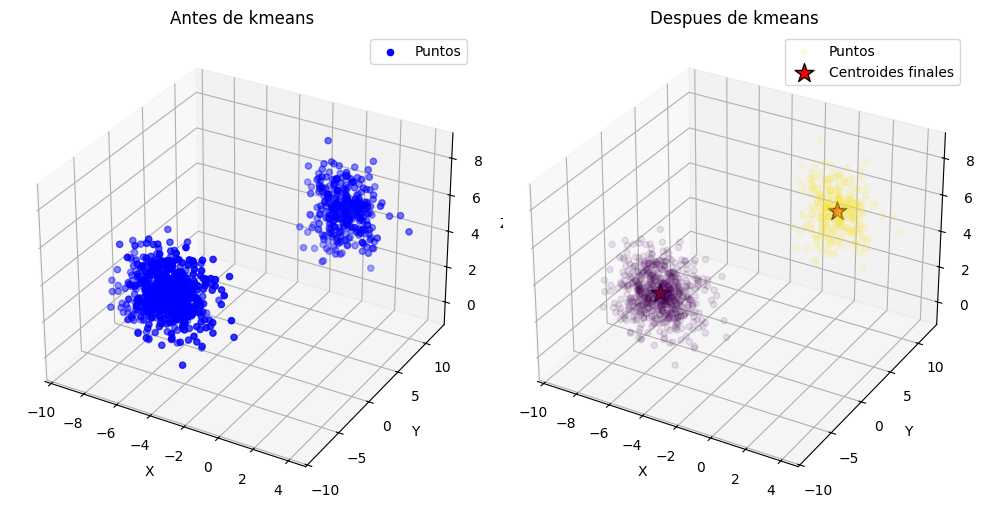

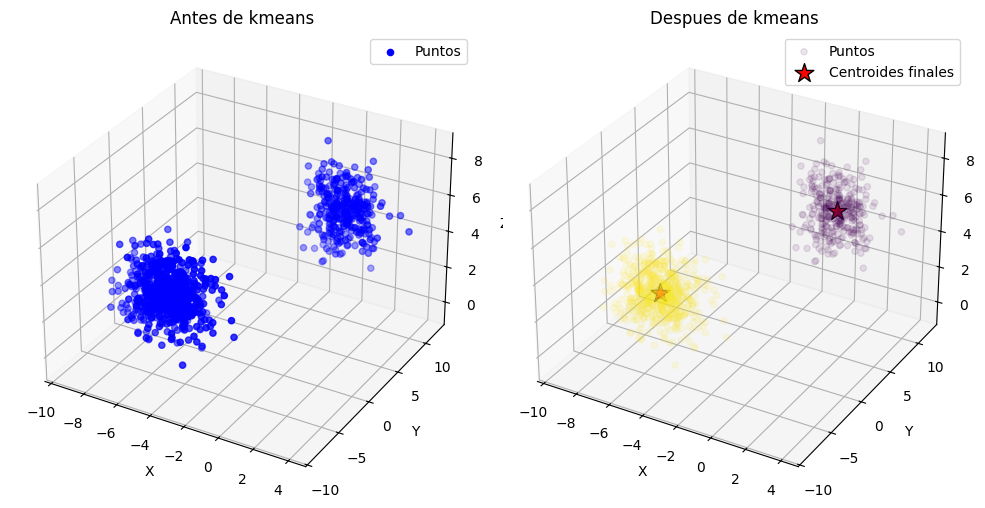

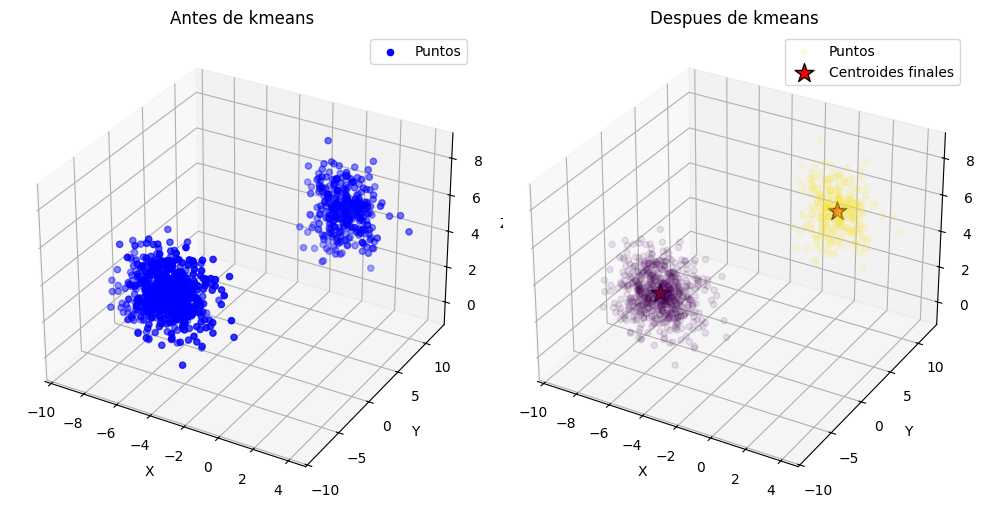

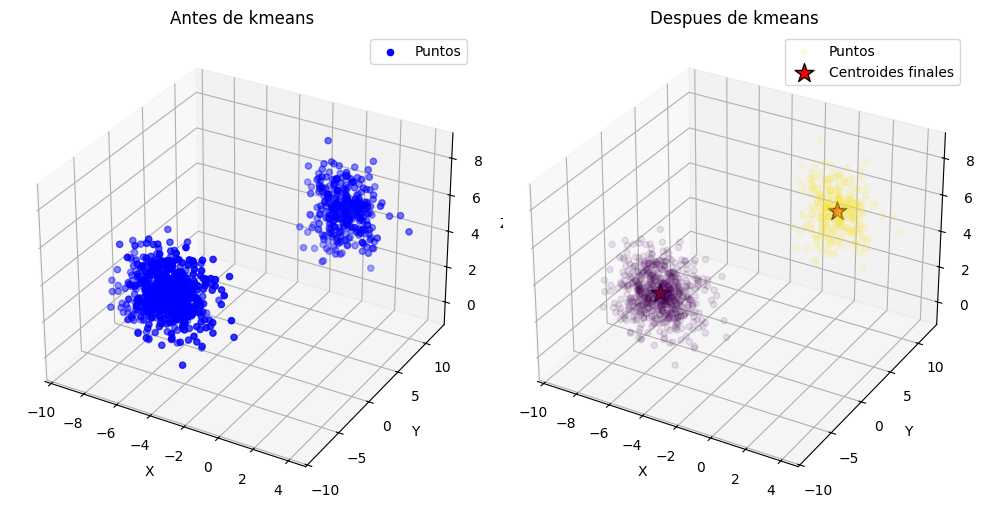

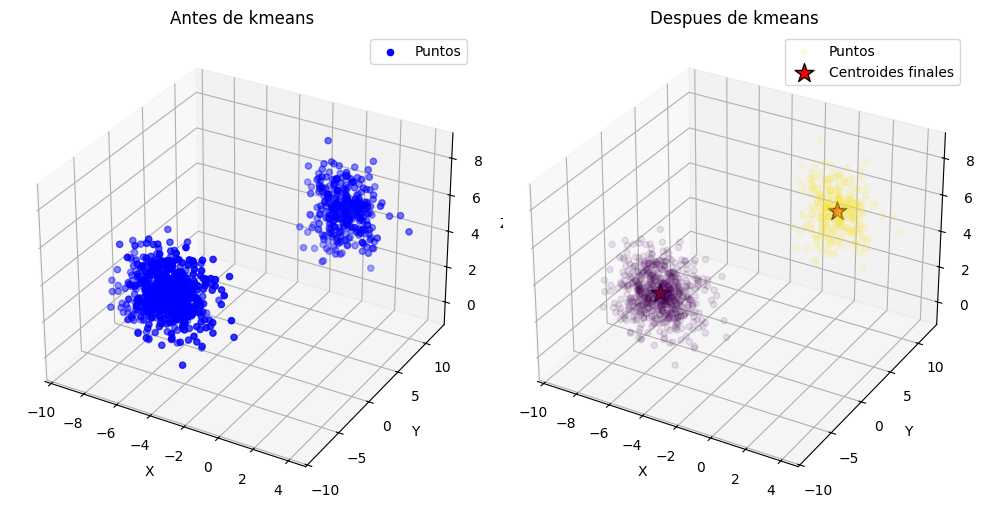

K = 3


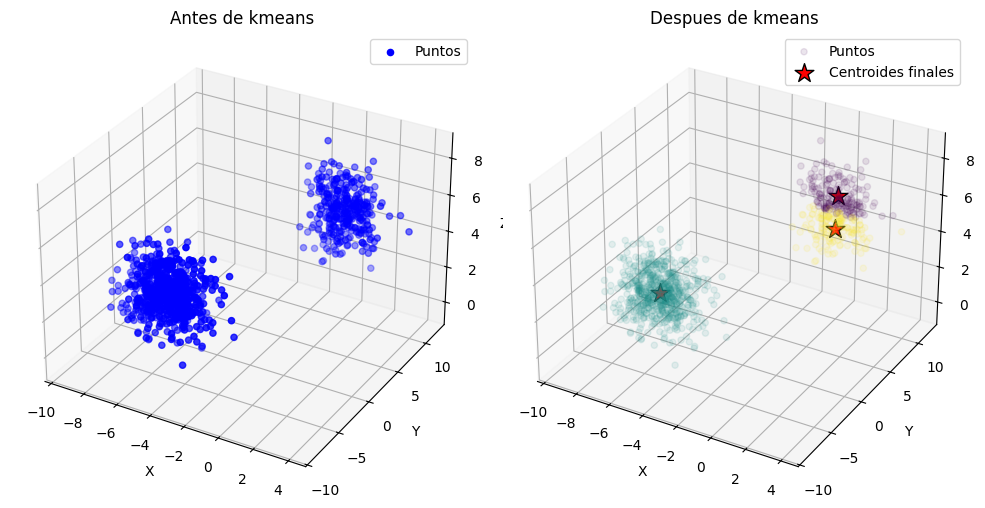

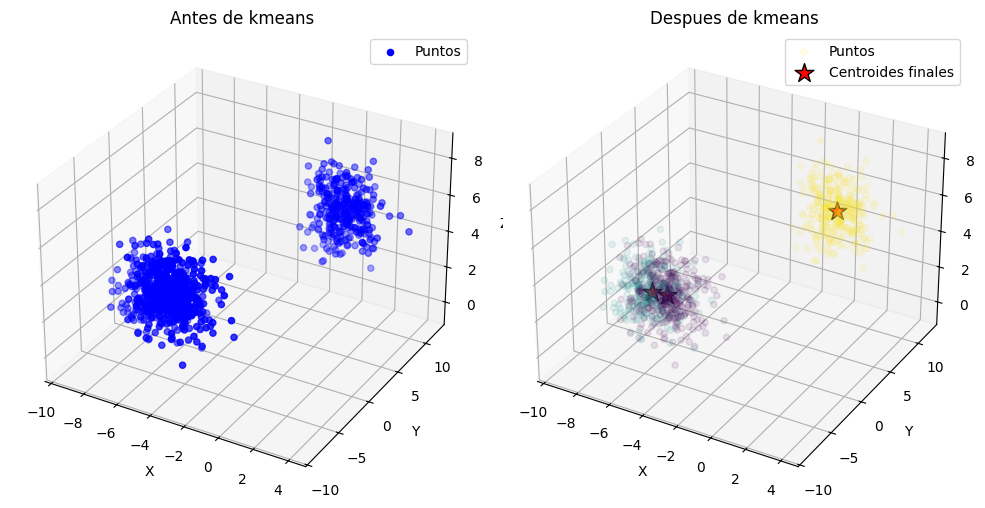

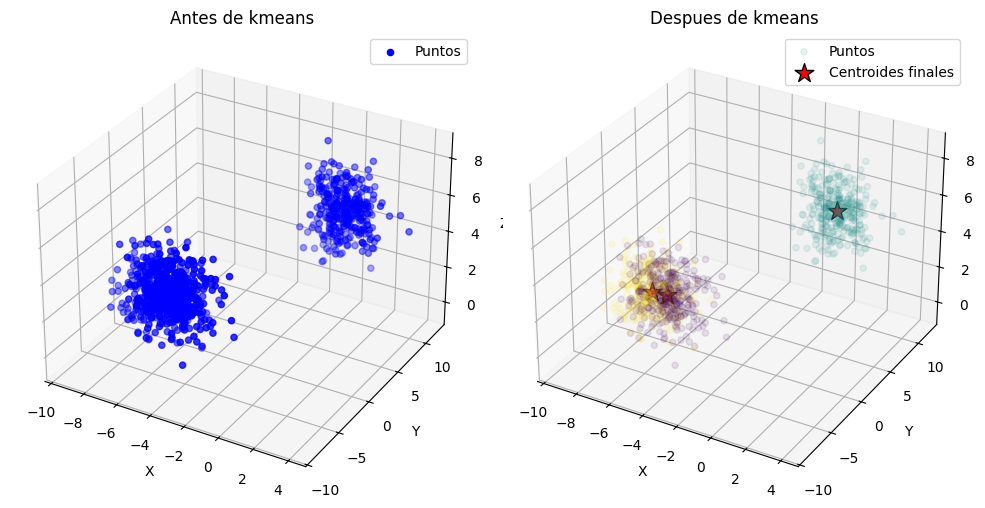

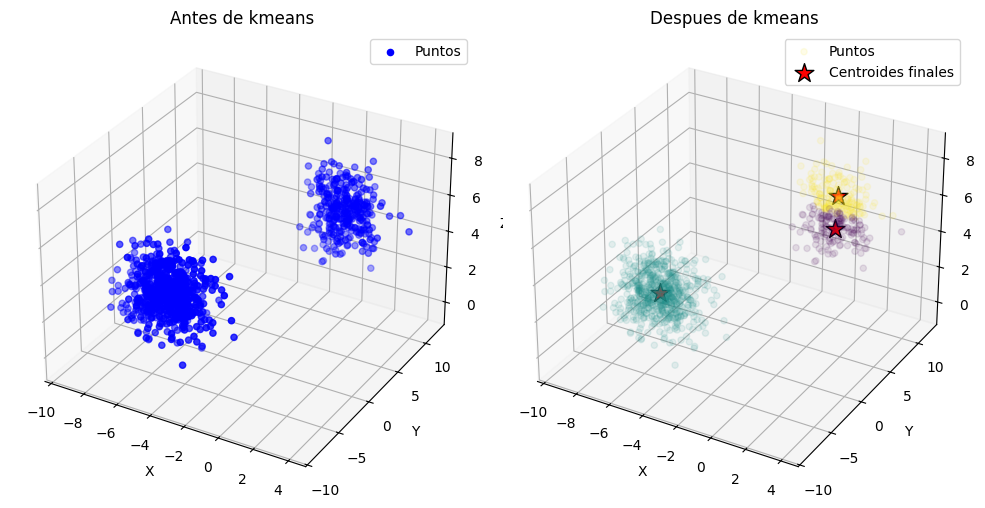

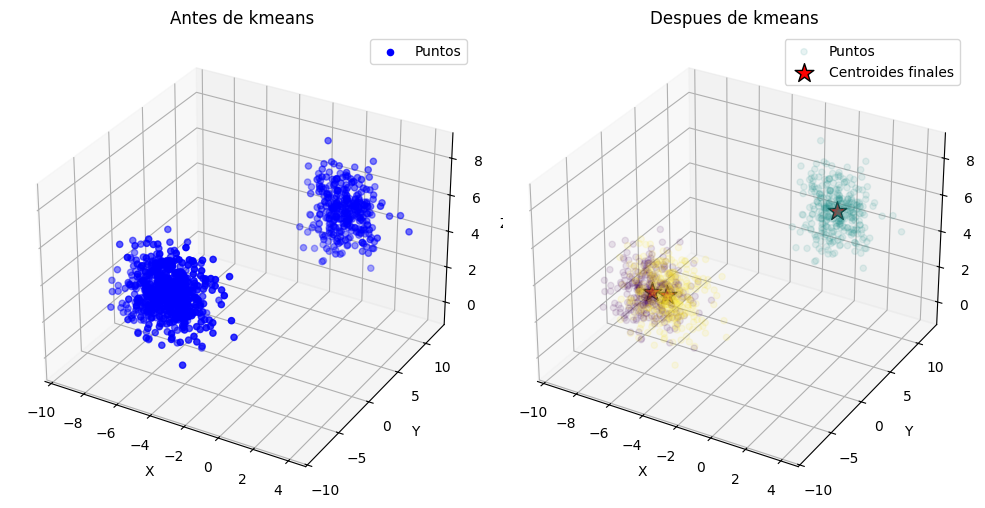

K = 5


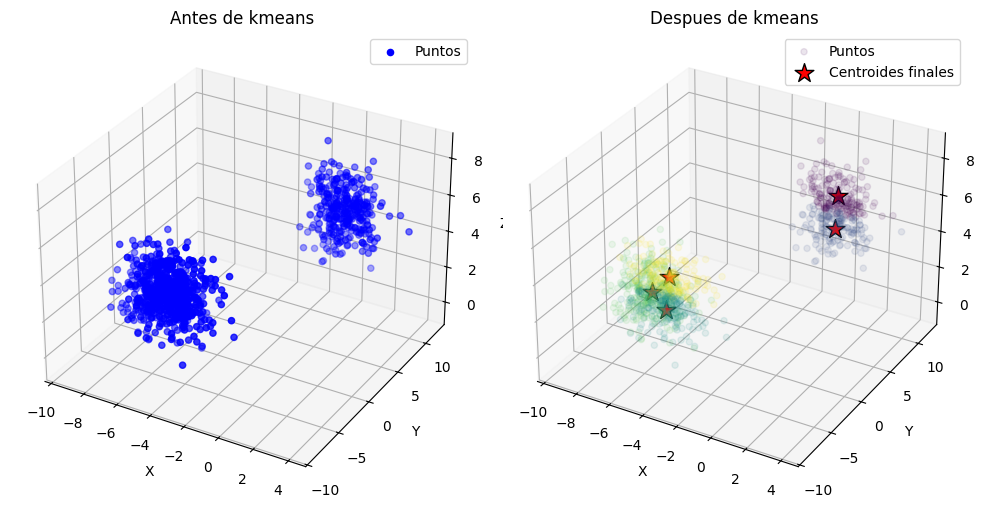

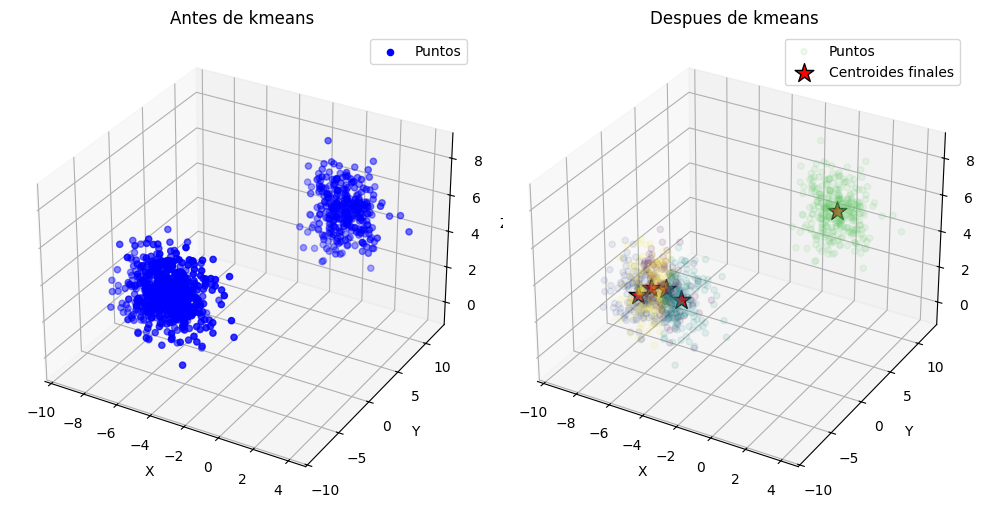

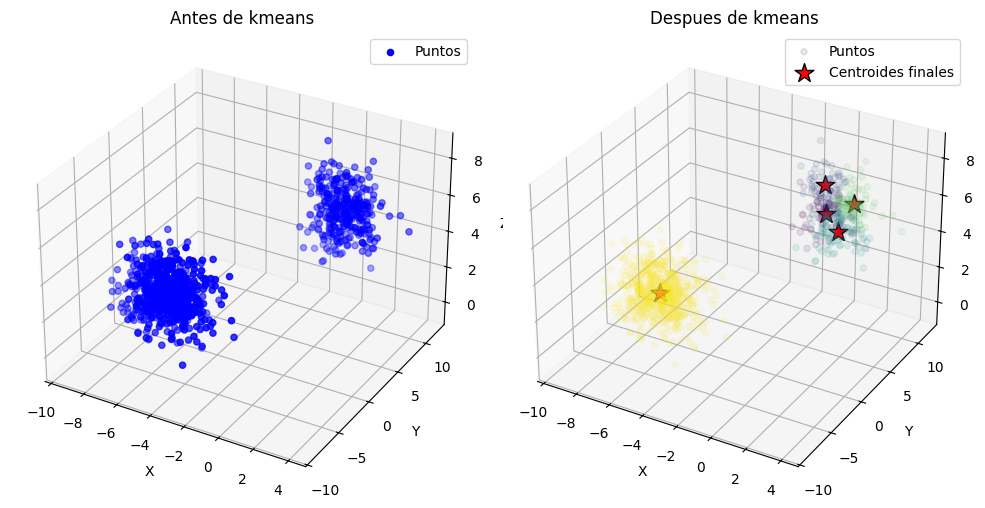

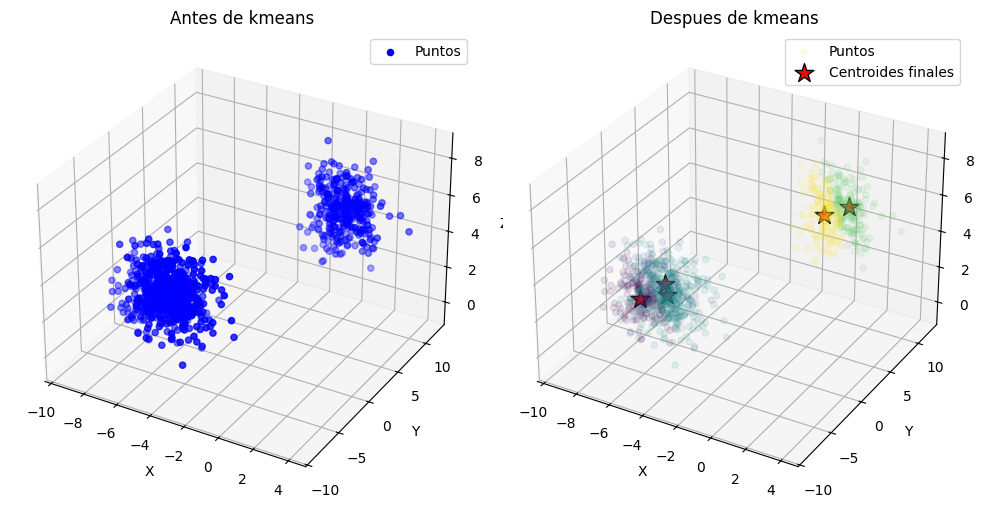

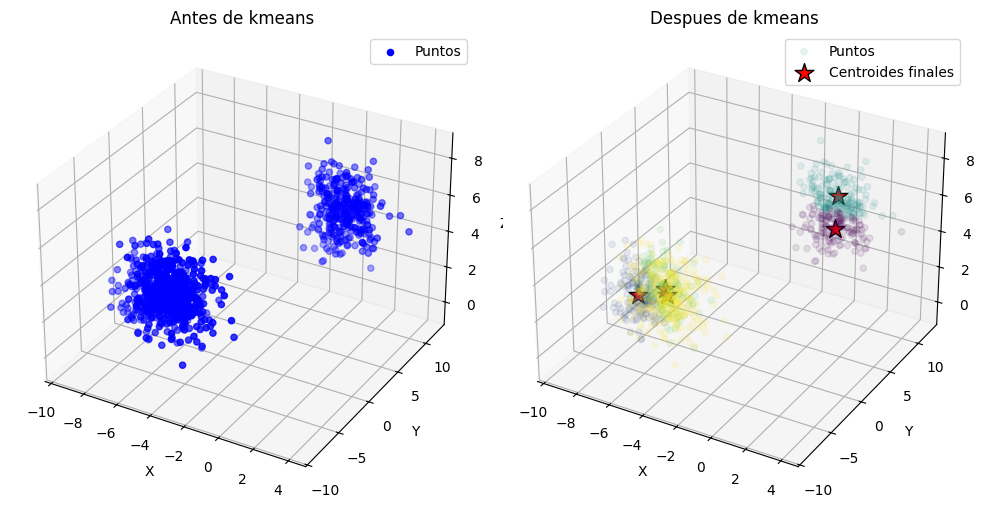

K = 10


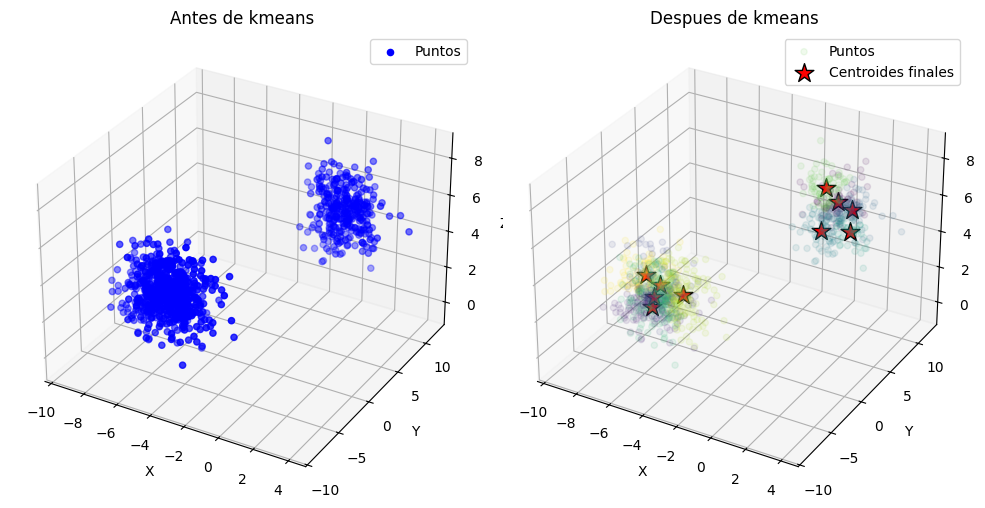

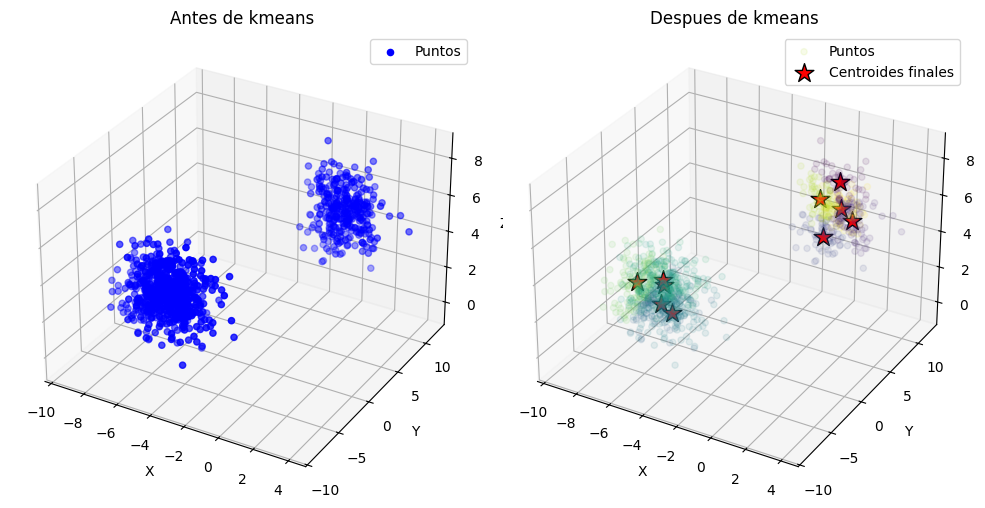

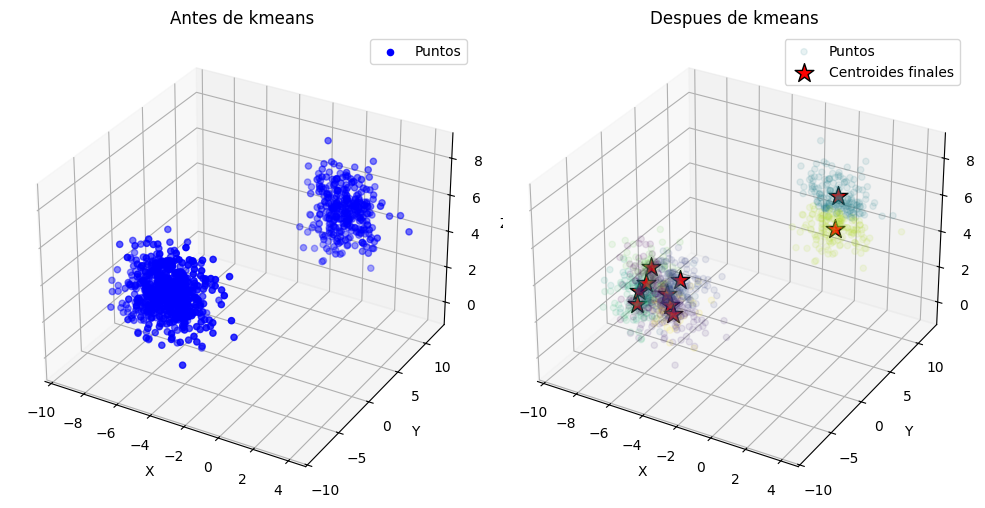

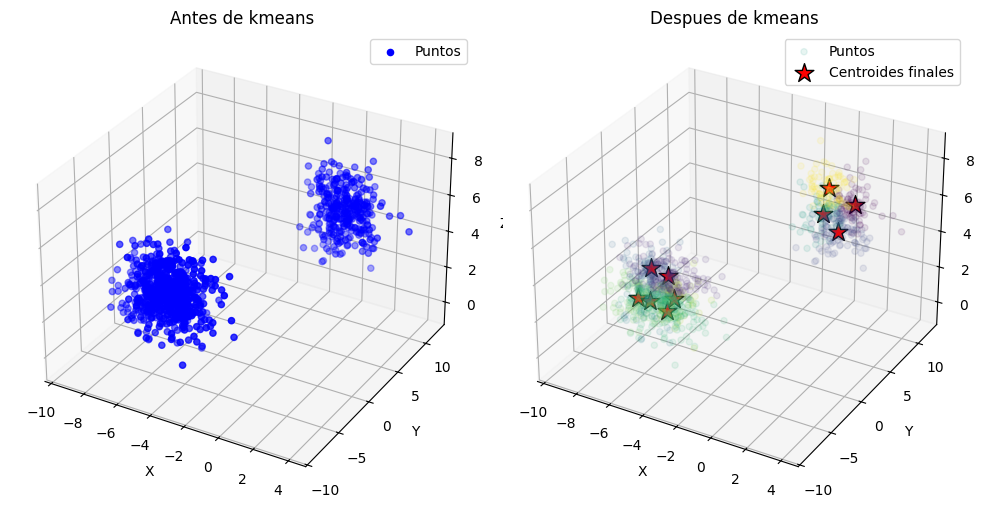

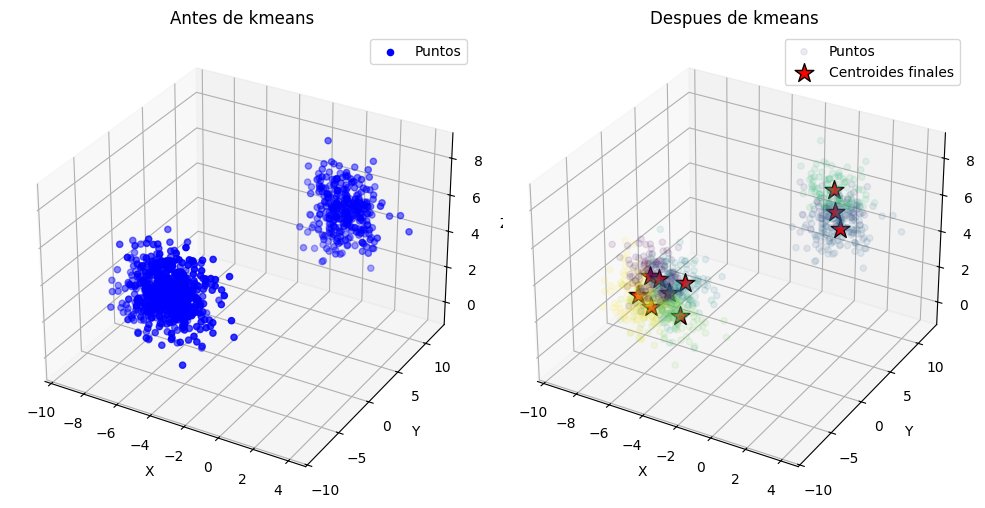

In [213]:
print("K = 2")
for i in range(5):
  kmeans = KMeans(k=2, max_iter=1000)
  labels = kmeans.run(points)
  dibujar3D(points, kmeans.centroids, labels)

print("K = 3")
for i in range(5):
  kmeans = KMeans(k=3, max_iter=1000)
  labels = kmeans.run(points)
  dibujar3D(points, kmeans.centroids, labels)

print("K = 5")
for i in range(5):
  kmeans = KMeans(k=5, max_iter=1000)
  labels = kmeans.run(points)
  dibujar3D(points, kmeans.centroids, labels)

print("K = 10")
for i in range(5):
  kmeans = KMeans(k=10, max_iter=1000)
  labels = kmeans.run(points)
  dibujar3D(points, kmeans.centroids, labels)

#Analisis 5 Exp
Se experimentó con 2, 3, 5 y 10 centroides, y 1000 iteraciones. La distribución se vio mejor usando solo 3 centroides

#Sexto Experimento

euclidean


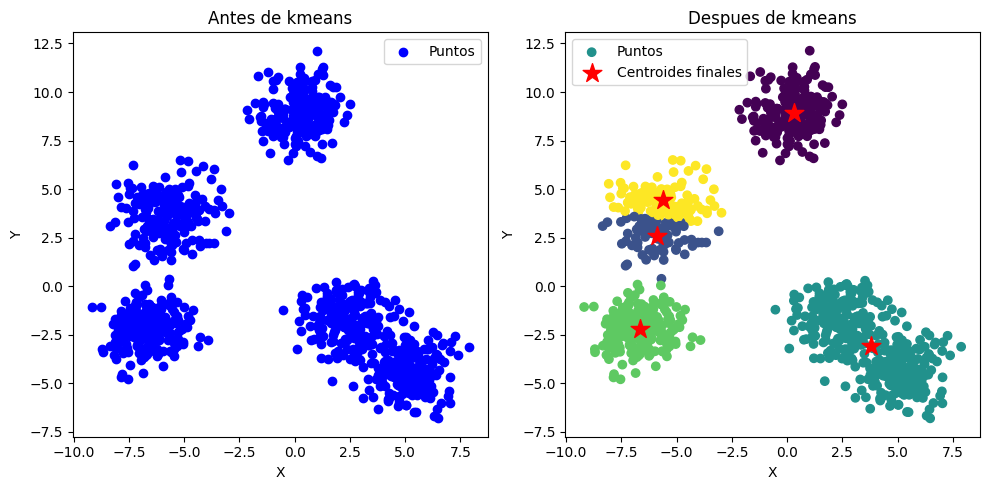

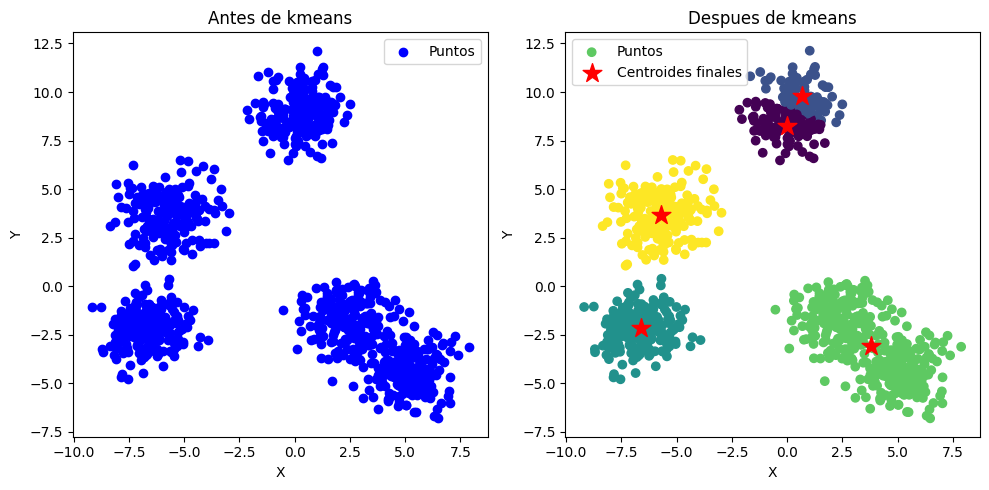

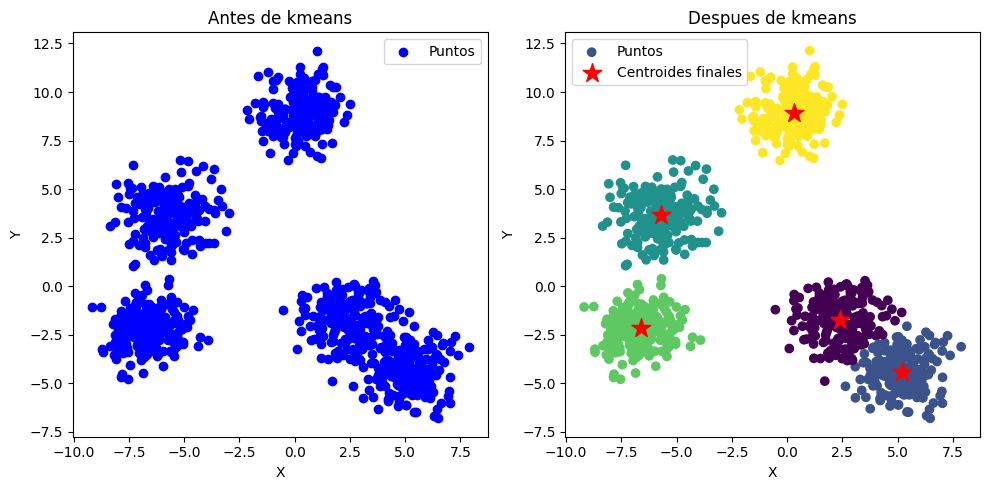

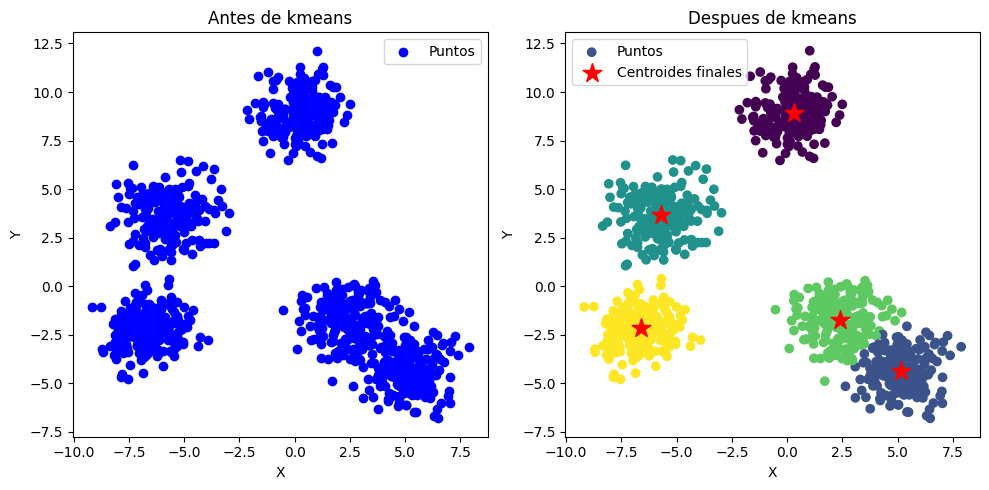

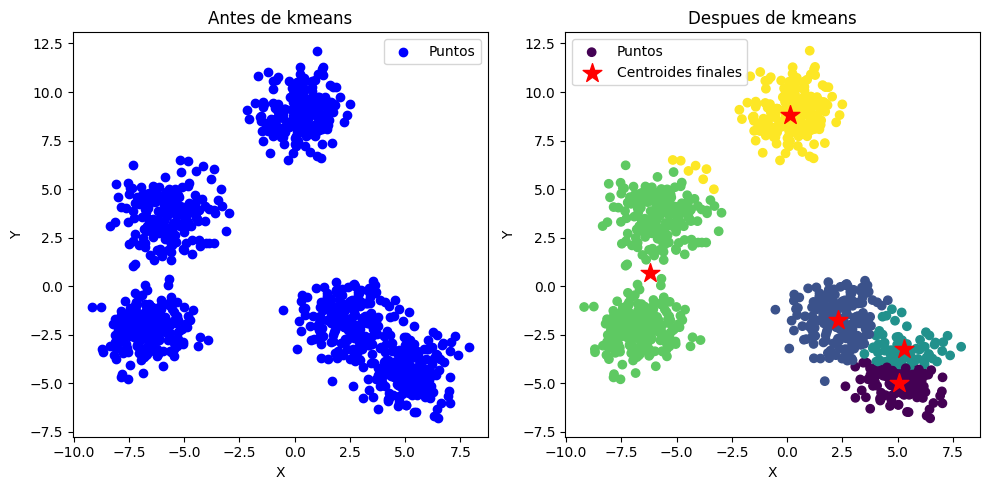

manhattan


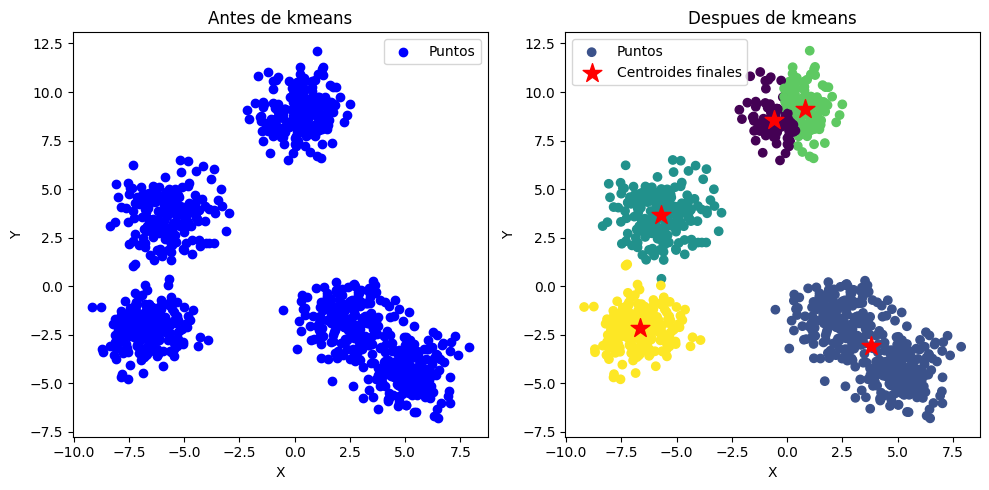

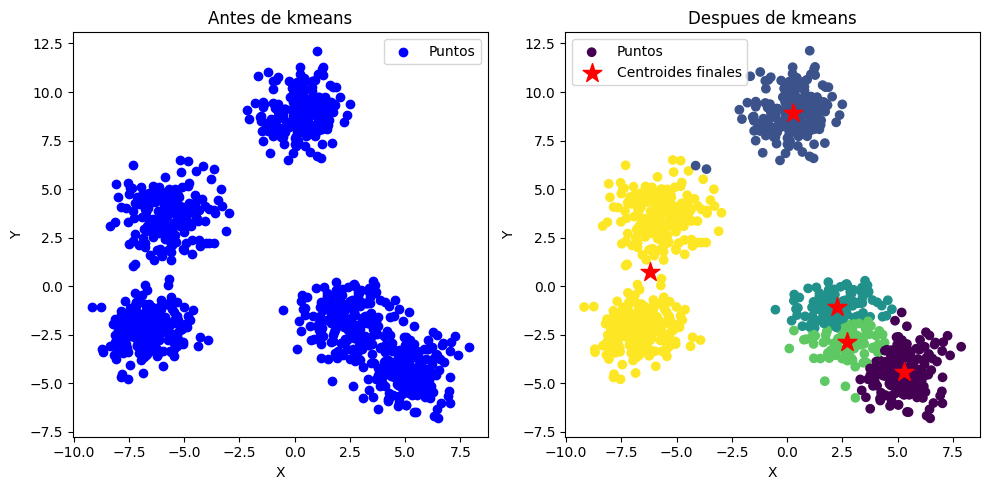

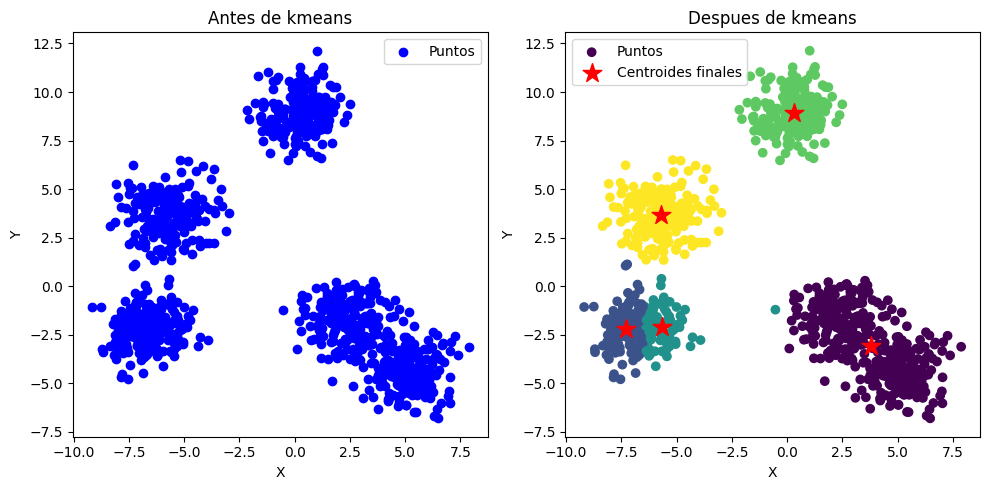

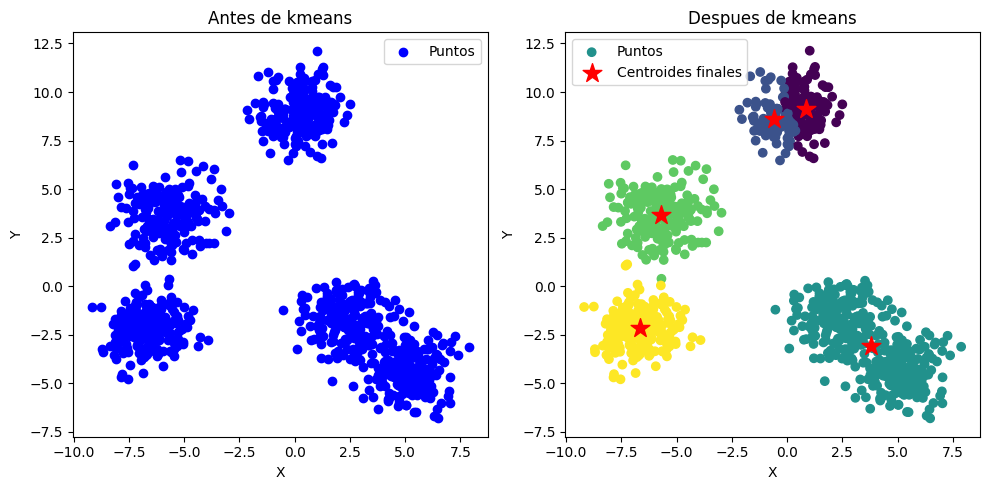

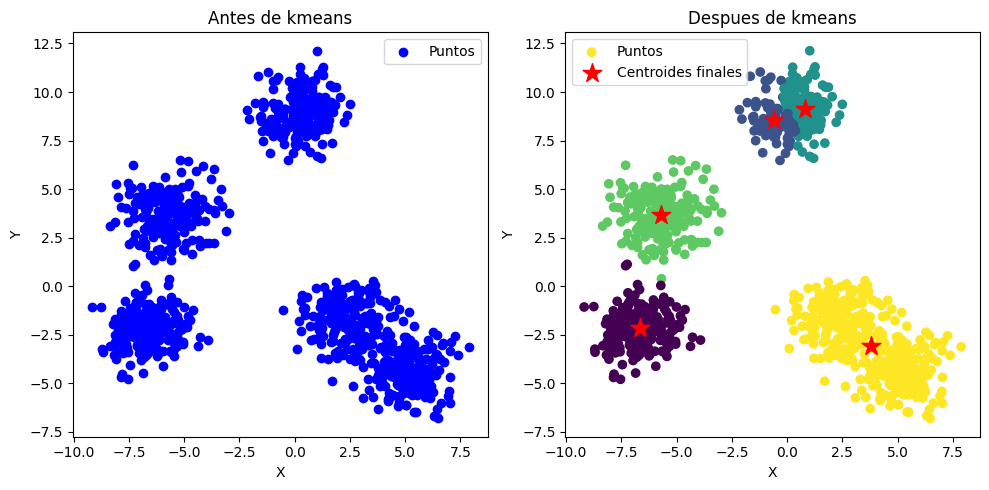

mahalanobis


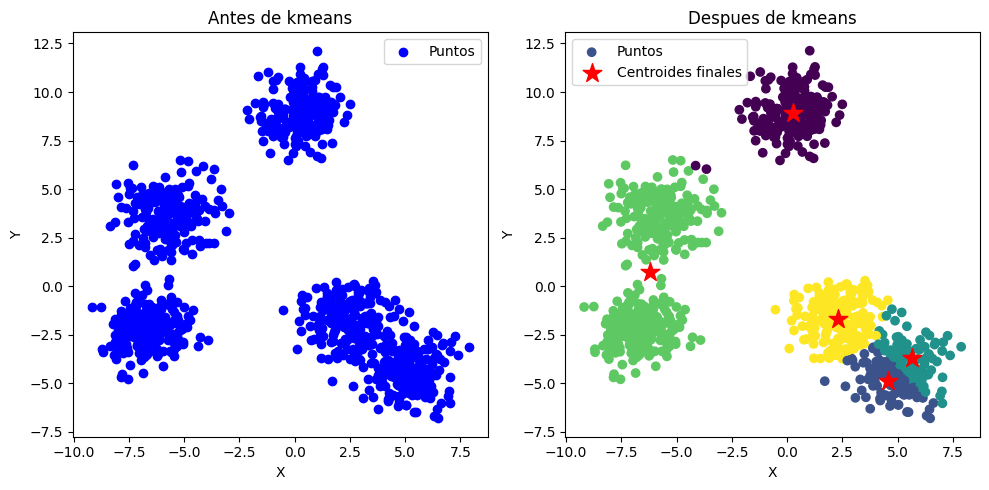

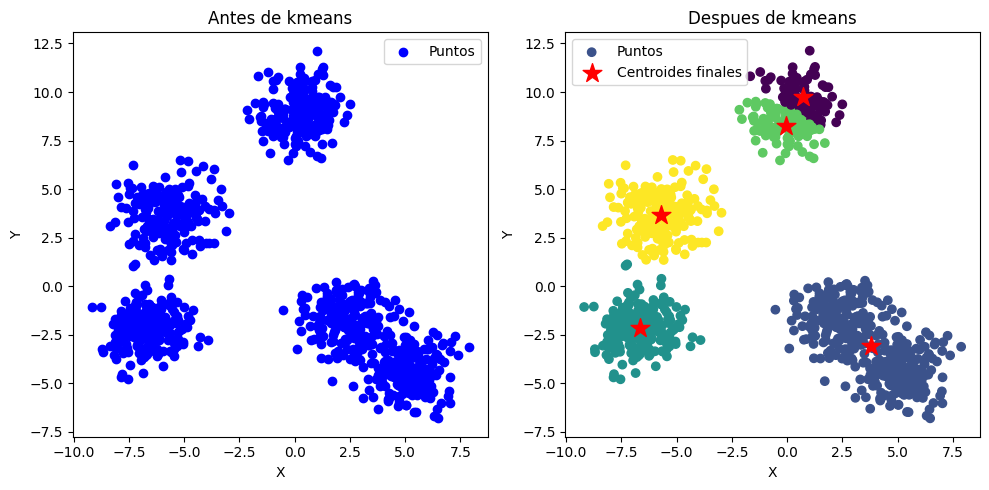

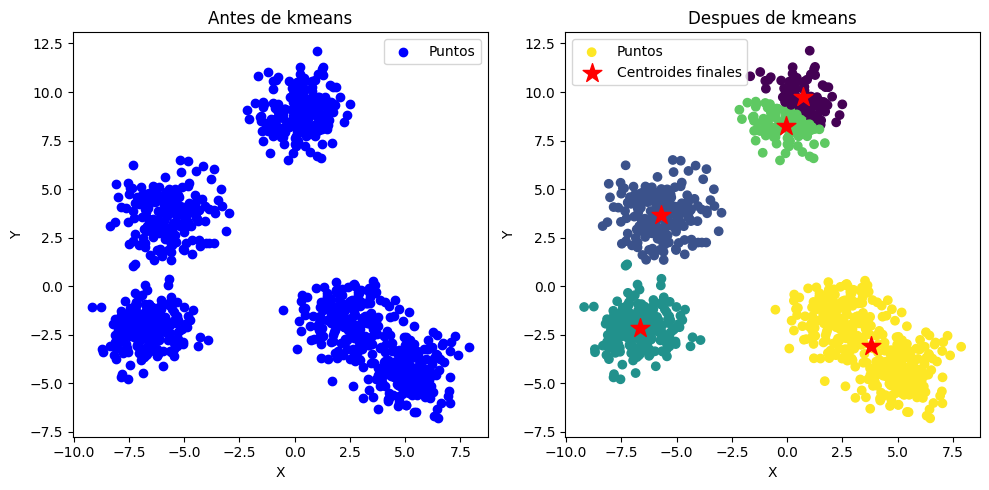

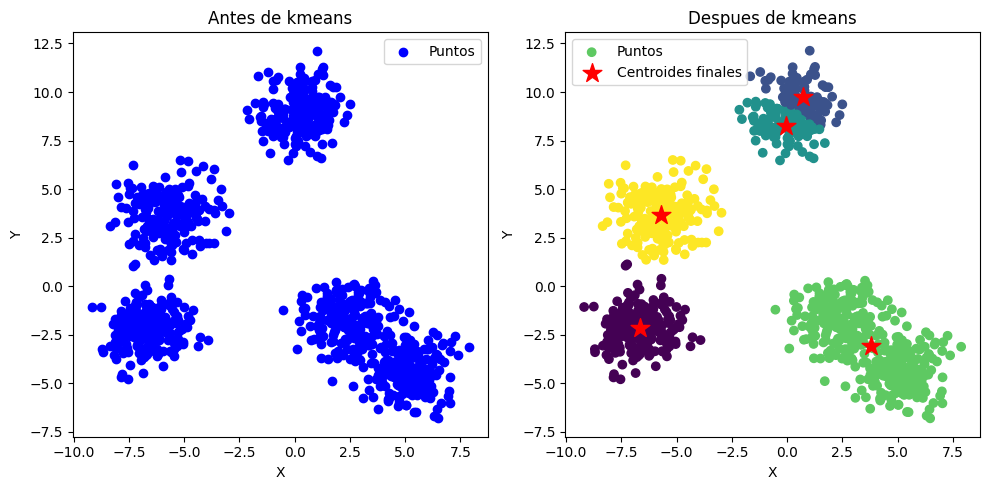

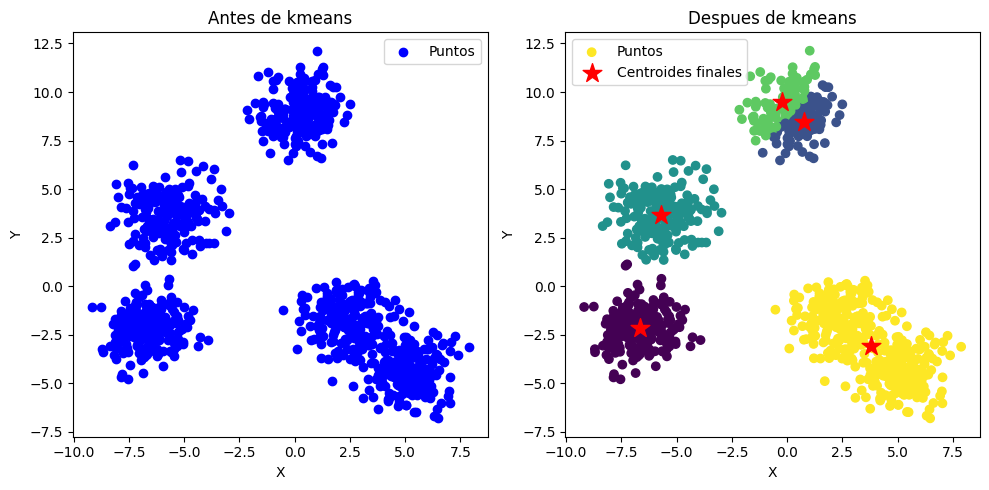

In [214]:
from sklearn.datasets import make_blobs
points, y = make_blobs(n_samples = 1000,n_features = 2,centers = 5,random_state = 23)
print("euclidean")
for i in range(5):
  kmeans = KMeans(k=5, max_iter=1000)
  labels = kmeans.run(points, tipo_distance="euclidean")
  dibujar2D(points, kmeans.centroids, labels)
print("manhattan")
for i in range(5):
  kmeans = KMeans(k=5, max_iter=1000)
  labels = kmeans.run(points, tipo_distance="manhattan")
  dibujar2D(points, kmeans.centroids, labels)
print("mahalanobis")
for i in range(5):
  kmeans = KMeans(k=5, max_iter=1000)
  labels = kmeans.run(points, tipo_distance="mahalanobis")
  dibujar2D(points, kmeans.centroids, labels)

#Analisis 6 Exp:
Euclidean, Manhattan, Mahalanobis. Se pusieron a prueba los tres antes mencionados para analizar la relación entre cada uno de sus resultados.
Se pudo evidenciar según nuestra percepción que Mahalanobis tomó mejor decisión de ubicar los centroides y el que mejor convergencia obtuvo.